In [2]:
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import math
import re
import os
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer 
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import pairwise_distances
from sklearn.metrics.pairwise import cosine_similarity
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout

plotly.offline.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")

In [3]:
data = pd.read_json('tops_fashion.json')

In [4]:
print('No. of data Points',data.shape[0])
print('No. of features/variables',data.shape[1])


No. of data Points 183138
No. of features/variables 19


### Terminology:
What is a dataset? <br>
Rows and columns <br>
Data-point <br>
Feature/variable <br>







In [5]:
data.columns

Index(['asin', 'author', 'availability', 'availability_type', 'brand', 'color',
       'editorial_reivew', 'editorial_review', 'formatted_price',
       'large_image_url', 'manufacturer', 'medium_image_url', 'model',
       'product_type_name', 'publisher', 'reviews', 'sku', 'small_image_url',
       'title'],
      dtype='object')

Of these 19 features, we will be using only 6 features in this workshop.
    1. asin  ( Amazon standard identification number)
    2. brand ( brand to which the product belongs to )
    3. color ( Color information of apparel, it can contain many colors as   a value ex: red and black stripes ) 
    4. product_type_name (type of the apperal, ex: SHIRT/TSHIRT )
    5. medium_image_url  ( url of the image )
    6. title (title of the product.)
    7. formatted_price (price of the product)

In [6]:
data = data[['asin', 'brand', 'color', 'medium_image_url', 'product_type_name', 'title', 'formatted_price']]

In [7]:
print ('Number of data points : ', data.shape[0], \
       'Number of features:', data.shape[1])
data.head() # prints the top rows in the table.

Number of data points :  183138 Number of features: 7


,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
0,B016I2TS4W,FNC7C,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Minions Como Superheroes Ironman Long Sleeve R...,None
1,B01N49AI08,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Izo Tunic,None
2,B01JDPCOHO,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Won Top,None
3,B01N19U5H5,Focal18,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Focal18 Sailor Collar Bubble Sleeve Blouse Shi...,None
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26


### [5.1] Missing data for various features.

####  Basic stats for the feature: product_type_name

In [8]:
print(data['product_type_name'].describe())

count     183138
unique        72
top        SHIRT
freq      167794
Name: product_type_name, dtype: object


In [9]:
# We have total 72 unique type of product_type_names
print(data['product_type_name'].unique())

['SHIRT' 'SWEATER' 'APPAREL' 'OUTDOOR_RECREATION_PRODUCT'
 'BOOKS_1973_AND_LATER' 'PANTS' 'HAT' 'SPORTING_GOODS' 'DRESS' 'UNDERWEAR'
 'SKIRT' 'OUTERWEAR' 'BRA' 'ACCESSORY' 'ART_SUPPLIES' 'SLEEPWEAR'
 'ORCA_SHIRT' 'HANDBAG' 'PET_SUPPLIES' 'SHOES' 'KITCHEN' 'ADULT_COSTUME'
 'HOME_BED_AND_BATH' 'MISC_OTHER' 'BLAZER' 'HEALTH_PERSONAL_CARE'
 'TOYS_AND_GAMES' 'SWIMWEAR' 'CONSUMER_ELECTRONICS' 'SHORTS' 'HOME'
 'AUTO_PART' 'OFFICE_PRODUCTS' 'ETHNIC_WEAR' 'BEAUTY'
 'INSTRUMENT_PARTS_AND_ACCESSORIES' 'POWERSPORTS_PROTECTIVE_GEAR' 'SHIRTS'
 'ABIS_APPAREL' 'AUTO_ACCESSORY' 'NONAPPARELMISC' 'TOOLS' 'BABY_PRODUCT'
 'SOCKSHOSIERY' 'POWERSPORTS_RIDING_SHIRT' 'EYEWEAR' 'SUIT'
 'OUTDOOR_LIVING' 'POWERSPORTS_RIDING_JACKET' 'HARDWARE' 'SAFETY_SUPPLY'
 'ABIS_DVD' 'VIDEO_DVD' 'GOLF_CLUB' 'MUSIC_POPULAR_VINYL'
 'HOME_FURNITURE_AND_DECOR' 'TABLET_COMPUTER' 'GUILD_ACCESSORIES'
 'ABIS_SPORTS' 'ART_AND_CRAFT_SUPPLY' 'BAG' 'MECHANICAL_COMPONENTS'
 'SOUND_AND_RECORDING_EQUIPMENT' 'COMPUTER_COMPONENT' 'JEWELRY'
 'B

In [10]:
product_type_count = Counter(list(data['product_type_name']))
product_type_count.most_common(10)

[('SHIRT', 167794),
 ('APPAREL', 3549),
 ('BOOKS_1973_AND_LATER', 3336),
 ('DRESS', 1584),
 ('SPORTING_GOODS', 1281),
 ('SWEATER', 837),
 ('OUTERWEAR', 796),
 ('OUTDOOR_RECREATION_PRODUCT', 729),
 ('ACCESSORY', 636),
 ('UNDERWEAR', 425)]

####  Basic stats for the feature: brand

In [11]:
# there are 10577 unique brands
print(data['brand'].describe())

count     182987
unique     10577
top         Zago
freq         223
Name: brand, dtype: object


In [12]:
brand_count = Counter(list(data['brand']))
brand_count.most_common(10)

[('Zago', 223),
 ('XQS', 222),
 ('Yayun', 215),
 ('YUNY', 198),
 ('XiaoTianXin-women clothes', 193),
 ('Generic', 192),
 ('Boohoo', 190),
 ('Alion', 188),
 ('Abetteric', 187),
 ('TheMogan', 187)]

####  Basic stats for the feature: color

In [13]:
print(data['color'].describe())
# we have 7380 unique colors
# 7.2% of products are black in color
# 64956 of 183138 products have brand information. That's approx 35.4%.

count     64956
unique     7380
top       Black
freq      13207
Name: color, dtype: object


In [14]:
color_count = Counter(list(data['color']))
color_count.most_common(10)

[(None, 118182),
 ('Black', 13207),
 ('White', 8616),
 ('Blue', 3570),
 ('Red', 2289),
 ('Pink', 1842),
 ('Grey', 1499),
 ('*', 1388),
 ('Green', 1258),
 ('Multi', 1203)]

####  Basic stats for the feature: formatted_price

In [15]:

print(data['formatted_price'].describe())

# Only 28,395 (15.5% of whole data) products with price information

count      28395
unique      3135
top       $19.99
freq         945
Name: formatted_price, dtype: object


In [16]:
price_count = Counter(list(data['formatted_price']))
price_count.most_common(10)

[(None, 154743),
 ('$19.99', 945),
 ('$9.99', 749),
 ('$9.50', 601),
 ('$14.99', 472),
 ('$7.50', 463),
 ('$24.99', 414),
 ('$29.99', 370),
 ('$8.99', 343),
 ('$9.01', 336)]

#### Basic stats for the feature: title


In [17]:
print(data['title'].describe())


count                                                183138
unique                                               175985
top       Nakoda Cotton Self Print Straight Kurti For Women
freq                                                     77
Name: title, dtype: object


In [22]:
#data.to_pickle('pickels/180k_apparel_data')

In [17]:
# consider products which have price information
# data['formatted_price'].isnull() => gives the information 
#about the dataframe row's which have null values price == None|Null
data = data.loc[~data['formatted_price'].isnull()]
print('Number of data points After eliminating price=NULL :', data.shape[0])

Number of data points After eliminating price=NULL : 28395


In [18]:
# consider products which have color information
# data['color'].isnull() => gives the information about the dataframe row's which have null values price == None|Null
data =data.loc[~data['color'].isnull()]
print('Number of data points After eliminating color=NULL :', data.shape[0])

Number of data points After eliminating color=NULL : 28385


In [26]:
#data.to_pickle('pickels/28k_apparel_data')

In [ ]:
'''
from PIL import Image
import requests 
from io import BytesIO
for index,rows in images.iterrows():
    url =  row['large_image_url']
    response = requests.get(url)
    img = Image.open(BytesIO(responses.content))
    img.save('images/28k_images/'+row['asin']+'.jpeg')
'''   

### [5.2] Remove near duplicate items

In [18]:
data = pd.read_pickle('28k_apparel_data')

# find number of products that have duplicate titles.
print(sum(data.duplicated('title')))
# we have 2325 products which have same title but different color


2325


#### These shirts are exactly same except in size (S, M,L,XL)

<table>
<tr> 
<td><img src="dedupe/B00AQ4GMCK.jpeg",width=100,height=100> :B00AQ4GMCK</td>
<td><img src="dedupe/B00AQ4GMTS.jpeg",width=100,height=100> :B00AQ4GMTS</td>
</tr>
<tr> 
<td><img src="dedupe/B00AQ4GMLQ.jpeg",width=100,height=100> :B00AQ4GMLQ</td>
<td><img src="dedupe/B00AQ4GN3I.jpeg",width=100,height=100> :B00AQ4GN3I</td>
</tr>
</table>

#### These shirts exactly same except  in color

<table>
<tr> 
<td><img src="dedupe/B00G278GZ6.jpeg",width=100,height=100> :B00G278GZ6</td>
<td><img src="dedupe/B00G278W6O.jpeg",width=100,height=100> :B00G278W6O</td>
</tr>
<tr> 
<td><img src="dedupe/B00G278Z2A.jpeg",width=100,height=100> :B00G278Z2A</td>
<td><img src="dedupe/B00G2786X8.jpeg",width=100,height=100> :B00G2786X8</td>
</tr>
</table>

#### In our data there are many duplicate products like the above examples, we need to de-dupe them for better results.


In [19]:
# read data from pickle file from previous stage
data = pd.read_pickle('28k_apparel_data')

In [20]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,Women's Unique 100% Cotton T - Special Olympic...,$9.99
11,B001LOUGE4,Fitness Etc.,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,Ladies Cotton Tank 2x1 Ribbed Tank Top,$11.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,FeatherLite Ladies' Moisture Free Mesh Sport S...,$20.54
21,B014ICEDNA,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,Supernatural Chibis Sam Dean And Castiel Short...,$7.50


In [21]:
data_sorted = data[data['title'].apply(lambda x : len(x.split())>4)] 
print("After removal of products with short description:", data_sorted.shape[0])

After removal of products with short description: 27949


In [22]:
# Sort the whole data based on title (alphabetical order of title) 
data_sorted.sort_values('title',inplace=True, ascending=False)
data_sorted.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
61973,B06Y1KZ2WB,Éclair,Black/Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,Éclair Women's Printed Thin Strap Blouse Black...,$24.99
133820,B010RV33VE,xiaoming,Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Womens Sleeveless Loose Long T-shirts...,$18.19
81461,B01DDSDLNS,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Women's White Long Sleeve Single Brea...,$21.58
75995,B00X5LYO9Y,xiaoming,Red Anchors,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Stripes Tank Patch/Bear Sleeve Anchor...,$15.91
151570,B00WPJG35K,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Sleeve Sheer Loose Tassel Kimono Woma...,$14.32


#### Some examples of dupliacte titles that differ only in the last few words.

<pre>
Titles 1:
16. woman's place is in the house and the senate shirts for Womens XXL White
17. woman's place is in the house and the senate shirts for Womens M Grey

Title 2:
25. tokidoki The Queen of Diamonds Women's Shirt X-Large
26. tokidoki The Queen of Diamonds Women's Shirt Small
27. tokidoki The Queen of Diamonds Women's Shirt Large

Title 3:
61. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
62. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
63. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
64. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
</pre>

In [24]:
indices = []
for i ,  rows in data_sorted.iterrows():
    indices.append(i)


In [25]:
import itertools
stage1_dedupe_asins = []
i = 0
j = 0
num_data_points = data_sorted.shape[0]
while i < num_data_points and j < num_data_points:
    
    previous_i = i

    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    a = data['title'].loc[indices[i]].split()

    # search for the similar products sequentially 
    j = i+1
    while j < num_data_points:

        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'Small']
        b = data['title'].loc[indices[j]].split()

        # store the maximum length of two strings
        length = max(len(a), len(b))

        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0] == k[1]):
                count += 1

        # if the number of words in which both strings differ are > 2 , we are considering it as those two apperals are different
        # if the number of words in which both strings differ are < 2 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) > 2: # number of words in which both sensences differ
            # if both strings are differ by more than 2 words we include the 1st string index
            stage1_dedupe_asins.append(data_sorted['asin'].loc[indices[i]])

            # if the comaprision between is between num_data_points, num_data_points-1 strings and they differ in more than 2 words we include both
            if j == num_data_points-1: stage1_dedupe_asins.append(data_sorted['asin'].loc[indices[j]])

            # start searching for similar apperals corresponds 2nd string
            i = j
            break
        else:
            j += 1
    if previous_i == i:
        break

In [26]:
data = data.loc[data['asin'].isin(stage1_dedupe_asins)]

#### We removed  the dupliactes which differ only at the end.

In [27]:
print('Number of data points : ', data.shape[0])

Number of data points :  17593


#### [5.2.3] Remove duplicates : Part 2

<pre>

In the previous cell, we sorted whole data in alphabetical order of  titles.Then, we removed titles which are adjacent and very similar title

But there are some products whose titles are not adjacent but very similar.

Examples:

Titles-1
86261.  UltraClub Women's Classic Wrinkle-Free Long Sleeve Oxford Shirt, Pink, XX-Large
115042. UltraClub Ladies Classic Wrinkle-Free Long-Sleeve Oxford Light Blue XXL

TItles-2
75004.  EVALY Women's Cool University Of UTAH 3/4 Sleeve Raglan Tee
109225. EVALY Women's Unique University Of UTAH 3/4 Sleeve Raglan Tees
120832. EVALY Women's New University Of UTAH 3/4-Sleeve Raglan Tshirt

</pre>

In [23]:
data = pd.read_pickle('17k_apperal_data')

In [24]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,Women's Unique 100% Cotton T - Special Olympic...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,FeatherLite Ladies' Moisture Free Mesh Sport S...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,Supernatural Chibis Sam Dean And Castiel O Nec...,$7.39
43,B0079BMKDS,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,APPAREL,Featherlite Ladies' Silky Smooth Pique (White)...,$13.53


In [ ]:
indices = []
for i,row in data.iterrows():
    indices.append(i)
stage2_dedup_asins = []
while len(indices) != 0:
    i = indices.pop()
    stage2_dedup_asins.append(data['asin'].loc[i])
    a = data['title'].loc[i].split()
    for j in indices:
        b = data['title'].loc[j].split()
        
        length = max(len(a),len(a))
        
        # count is used to store the number of words that are matched in both strings
        count  = 0
        for k in itertools.zip_longest(a,b): 
            if (k[0]==k[1]):
                count += 1

        # if the number of words in which both strings differ are < 3 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) < 3:
            indices.remove(j)

In [ ]:
data = data.loc[data['asin'].isin(stage2_dedupe_asins)]

In [ ]:
print('Number of data points after stage two of dedupe: ',data.shape[0])
# from 17k apperals we reduced to 16k apperals

In [ ]:
data.to_pickle('pickels/16k_apperal_data')
# Storing these products in a pickle file
# candidates who wants to download these files instead 
# of 180K they can download and use them from the Google Drive folder.

# 6. Text pre-processing

In [25]:
data = pd.read_pickle('16k_apperal_data')

# NLTK download stop words. [RUN ONLY ONCE]
# goto Terminal (Linux/Mac) or Command-Prompt (Window) 
# In the temrinal, type these commands
# $python3
# $import nltk
# $nltk.download()

In [26]:
stop_words = set(stopwords.words('english'))
print('list of stop words',stop_words)
def nlp_preprocessing(total_text,index,column):
    if type(total_text) is not int:
        string = ""
        for words in total_text.split():
            word = ("".join(e for e in words if e.isalnum()))
            word = word.lower()
            if not word in stop_words:
                string+=word + " "
        data[column][index] = string     

list of stop words {'don', "wasn't", 'ma', "it's", 'each', 'this', 'y', 'under', 'same', 'won', 'yours', 'too', 'in', 'some', 'whom', 'we', 'on', "mustn't", "you'd", 'here', 'isn', 'have', 'our', 'before', 'shan', "isn't", 'such', 's', "mightn't", 'these', 'had', 'ourselves', 'while', 'd', 'an', 'do', 'weren', 'any', 'it', 'other', 'no', 'or', 'were', 'i', 'wouldn', 'your', 'itself', 'himself', "haven't", 'mustn', 'is', 've', 'her', 'which', 'him', 'm', 'll', 'about', 'having', 'into', "shouldn't", 'shouldn', "aren't", 're', 'aren', 'me', 'hasn', "should've", "that'll", 'has', 'very', "weren't", "hasn't", 'needn', 'for', "don't", 'over', 'couldn', 'as', 'further', "won't", 'until', 'mightn', "you've", 'but', 'she', 'them', 'ours', 'was', 'how', 'now', 'been', "didn't", "needn't", 'during', 'does', 'by', 'be', 'because', 'haven', 'their', 'what', 'that', 'didn', "you'll", 'my', "you're", 'theirs', "she's", 'you', 'yourself', 'doing', 'of', 'why', 'o', 'between', 'those', 'after', 'mysel

In [27]:
import time
start_time = time.clock()
# we take each title and we text-preprocess it.
for index, row in data.iterrows():
    nlp_preprocessing(row['title'], index, 'title')
# we print the time it took to preprocess whole titles 
print(time.clock() - start_time, "seconds")

7.278737504899114 seconds


In [28]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


# [8] Text based product similarity

In [29]:
data = pd.read_pickle('16k_apperal_data_preprocessed')
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


In [62]:
def display_img(url,ax,fig):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    plt.imshow(img)
def plot_heatmap(keys,values,labels,url,text):
    gs = gridspec.GridSpec(2,2,width_ratios=[4,1],height_ratios = [4,1])
    fig = plt.figure(figsize=(25,3))
    ax = plt.subplot(gs[0])
    ax = sns.heatmap(np.array([values]), annot = np.array([labels]))
    ax.set_xticklabels(keys) # set that axis labels as the words of title
    ax.set_title(text) # apparel title
    ax = plt.subplot(gs[1])
        # we don't want any grid lines for image and no labels on x-axis and y-axis
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    display_img(url,ax,fig)
    plt.show()
def plot_heatmap_image(doc_id,vec1,vec2,url,text,model):
    intersection = set(vec1.keys())&set(vec2.keys())
    for i in vec2:
        if i not in intersection:
            vec2[i] = 0
    keys = list(vec2.keys())
    values = [vec2[x] for x in vec2.keys()]
    if model == 'bag_of_words':
        labels = values
    elif model == 'tfidf':
        labels = []
        for x in vec2.keys():
            if x in tfidf_title_vectorizer.vocabulary_:
                labels.append(tfidf_title_features[doc_id,tfidf_title_vectorizer.vocabulary_[x]])
            else:
                
                labels.append(0)   
    elif model == 'idf':
        labels = []
        for x in vec2.keys():
            # idf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # idf_title_features[doc_id, index_of_word_in_corpus] will give the idf value of word in given document (doc_id)
            if x in  idf_title_vectorizer.vocabulary_:
                labels.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)

    plot_heatmap(keys, values, labels, url, text)
def text_to_vector(text):
    word = re.compile(r'\w+')
    words = word.findall(text)
    # words stores list of all words in given string, you can try 'words = text.split()' this will also gives same result
    return Counter(words) # Counter counts the occurence of each word in list, it returns dict type object {word1:count}
def get_result(doc_id,content_a,content_b,url,model):
    text1 = content_a
    text2 = content_b
    
    # vector1 = dict{word11:#count, word12:#count, etc.}
    vector1 = text_to_vector(text1)

    # vector1 = dict{word21:#count, word22:#count, etc.}
    vector2 = text_to_vector(text2)

    plot_heatmap_image(doc_id, vector1, vector2, url, text2, model)
    


In [31]:
from sklearn.feature_extraction.text import CountVectorizer
title_vectorizer = CountVectorizer()
title_features   = title_vectorizer.fit_transform(data['title'])
title_features.get_shape()

(16042, 12609)

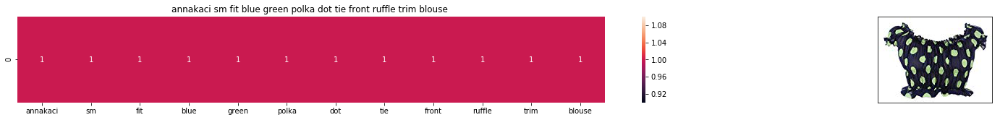

ASIN : B00KLHUIBS
Brand: Anna-Kaci
Title: annakaci sm fit blue green polka dot tie front ruffle trim blouse 
Euclidean similarity with the query image : 0.0


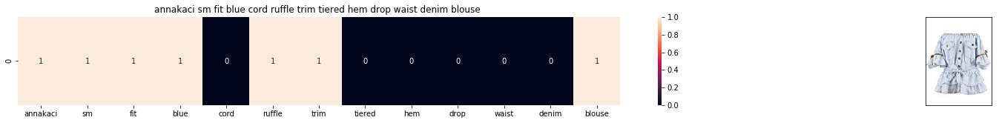

ASIN : B0759G15ZX
Brand: Anna-Kaci
Title: annakaci sm fit blue cord ruffle trim tiered hem drop waist denim blouse 
Euclidean similarity with the query image : 3.3166247903554


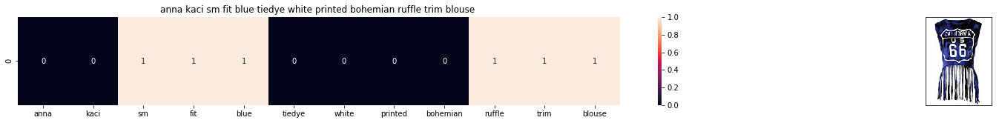

ASIN : B00YQ8S4K0
Brand: Anna-Kaci
Title: anna kaci sm fit blue tiedye white printed bohemian ruffle trim blouse 
Euclidean similarity with the query image : 3.4641016151377544


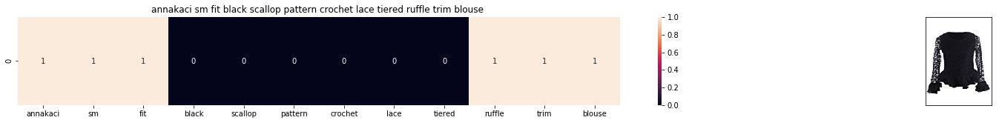

ASIN : B00O194W8W
Brand: Anna-Kaci
Title: annakaci sm fit black scallop pattern crochet lace tiered ruffle trim blouse 
Euclidean similarity with the query image : 3.4641016151377544


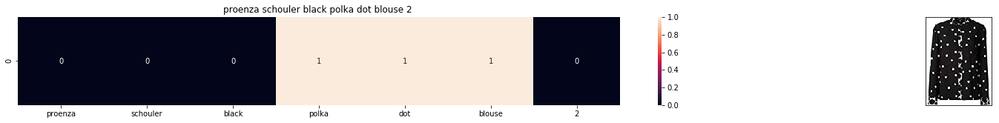

ASIN : B074TLHLMN
Brand: Proenza Schouler
Title: proenza schouler black polka dot blouse 2 
Euclidean similarity with the query image : 3.4641016151377544


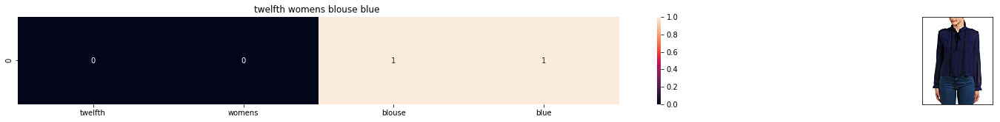

ASIN : B074F5BP5F
Brand: On Twelfth
Title: twelfth womens blouse blue 
Euclidean similarity with the query image : 3.4641016151377544


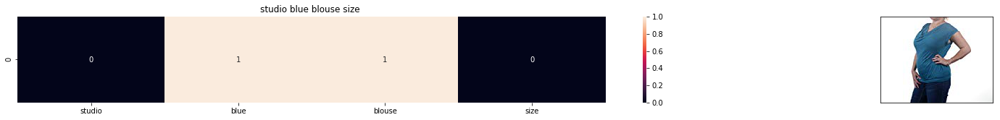

ASIN : B016P80OKQ
Brand: Studio M
Title: studio blue blouse size 
Euclidean similarity with the query image : 3.4641016151377544


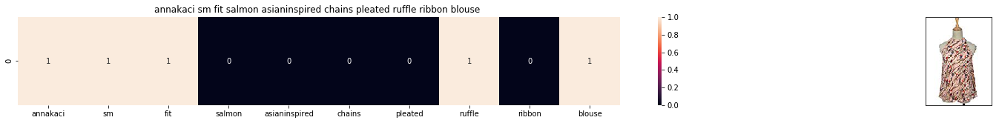

ASIN : B007KSG42S
Brand: Anna-Kaci
Title: annakaci sm fit salmon asianinspired chains pleated ruffle ribbon blouse 
Euclidean similarity with the query image : 3.4641016151377544


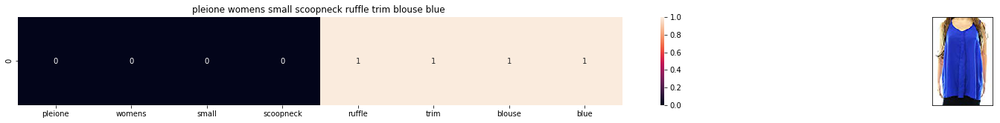

ASIN : B072VHTT1D
Brand: Pleione
Title: pleione womens small scoopneck ruffle trim blouse blue 
Euclidean similarity with the query image : 3.4641016151377544


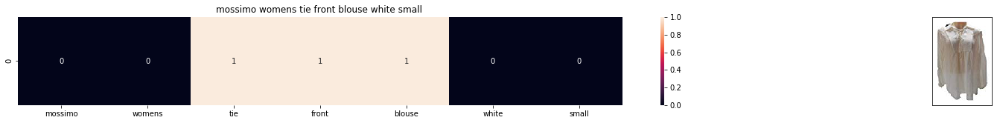

ASIN : B07111HHX6
Brand: Mossimo
Title: mossimo womens tie front blouse white small 
Euclidean similarity with the query image : 3.605551275463989


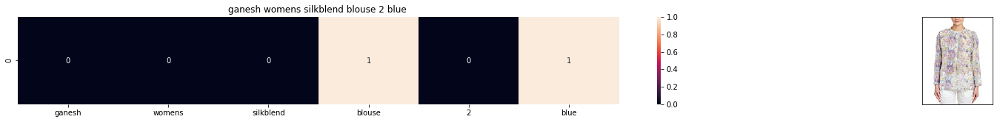

ASIN : B01N3SAT1F
Brand: Ganesh
Title: ganesh womens silkblend blouse 2 blue 
Euclidean similarity with the query image : 3.605551275463989


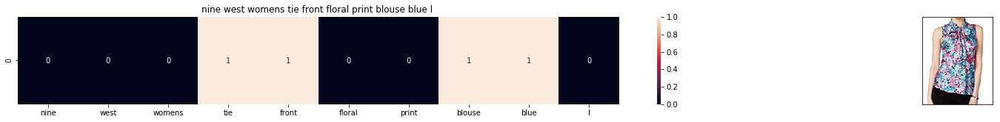

ASIN : B06WW5C6NJ
Brand: Nine West
Title: nine west womens tie front floral print blouse blue l 
Euclidean similarity with the query image : 3.605551275463989


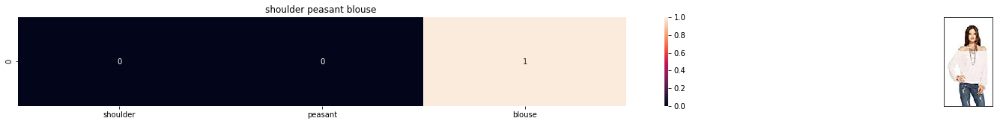

ASIN : B01E1QD5PK
Brand: CHASER
Title: shoulder peasant blouse 
Euclidean similarity with the query image : 3.605551275463989


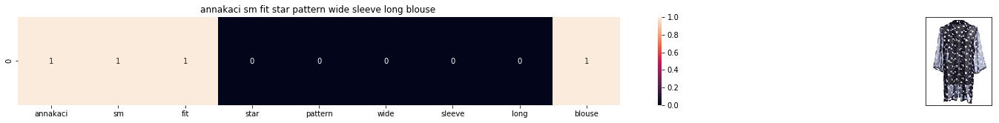

ASIN : B00G5RYY18
Brand: Anna-Kaci
Title: annakaci sm fit star pattern wide sleeve long blouse 
Euclidean similarity with the query image : 3.605551275463989


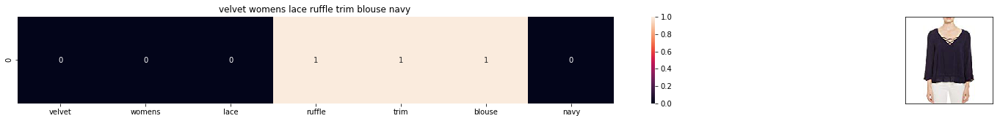

ASIN : B06XCZGQLP
Brand: Velvet by Graham & Spencer
Title: velvet womens lace ruffle trim blouse navy 
Euclidean similarity with the query image : 3.605551275463989


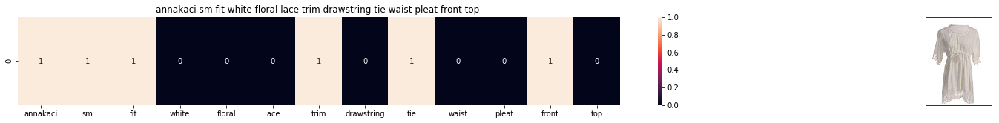

ASIN : B00DW1NKSS
Brand: Anna-Kaci
Title: annakaci sm fit white floral lace trim drawstring tie waist pleat front top 
Euclidean similarity with the query image : 3.605551275463989


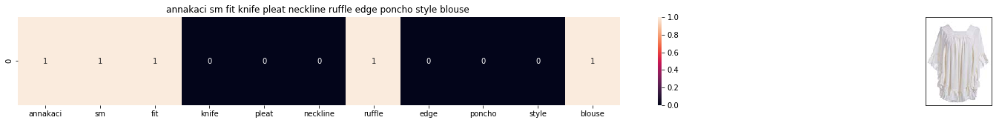

ASIN : B00HCNNOJW
Brand: Anna-Kaci
Title: annakaci sm fit knife pleat neckline ruffle edge poncho style blouse 
Euclidean similarity with the query image : 3.605551275463989


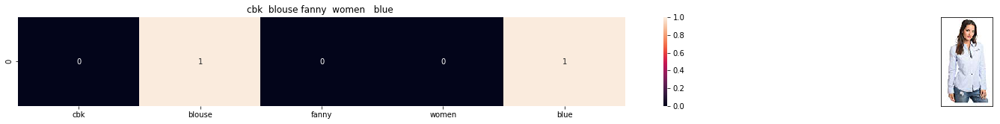

ASIN : B071NDX99J
Brand: CBK
Title: cbk  blouse fanny  women   blue 
Euclidean similarity with the query image : 3.605551275463989


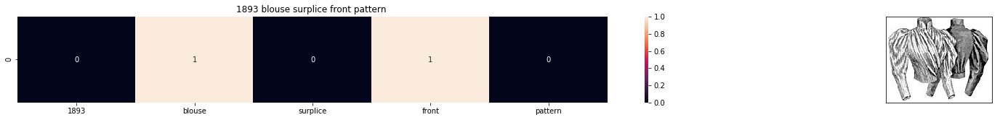

ASIN : B00886YXL0
Brand: Ageless Patterns
Title: 1893 blouse surplice front pattern 
Euclidean similarity with the query image : 3.605551275463989


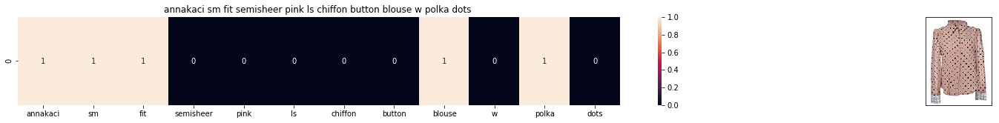

ASIN : B008Z5ST3C
Brand: Anna-Kaci
Title: annakaci sm fit semisheer pink ls chiffon button blouse w polka dots 
Euclidean similarity with the query image : 3.605551275463989


In [38]:
def bag_of_words_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(title_features,title_features[doc_id])
    
    # np.argsort will return indices of the smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'bag_of_words')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print ('Brand:', data['brand'].loc[df_indices[i]])
        print ('Title:', data['title'].loc[df_indices[i]])
        print ('Euclidean similarity with the query image :', pdists[i])
        print('='*60)

#call the bag-of-words model for a product to get similar products.
bag_of_words_model(931, 20) # change the index if you want to.
# In the output heat map each value represents the count value 
# of the label word, the color represents the intersection 
# with inputs title.

#try 12566
#try 931

In [37]:
tfidf_title_vectorizer = TfidfVectorizer(min_df = 0)
tfidf_title_features = tfidf_title_vectorizer.fit_transform(data['title'])
# tfidf_title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(courpus) returns the a sparase matrix of dimensions #data_points * #words_in_corpus
# tfidf_title_features[doc_id, index_of_word_in_corpus] = tfidf values of the word in given doc

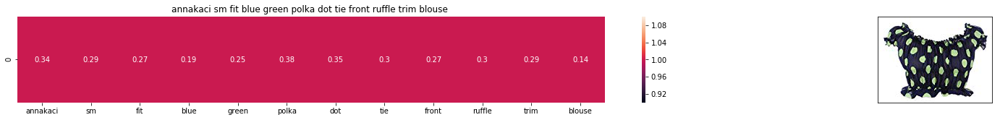

ASIN : B00KLHUIBS
BRAND : Anna-Kaci
Eucliden distance from the given image : 0.0


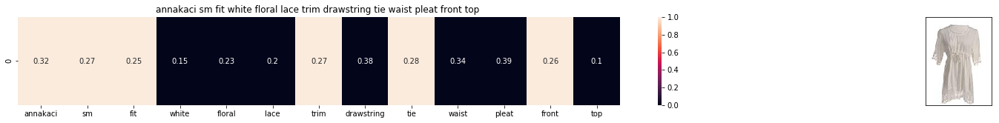

ASIN : B00DW1NKSS
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.0095030470167985


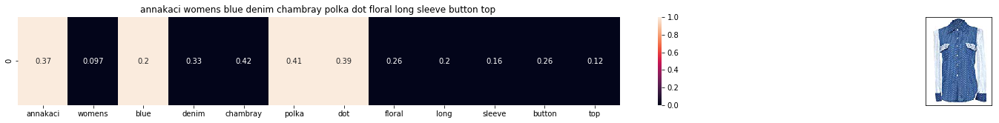

ASIN : B008SMIFN6
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.0417985120306876


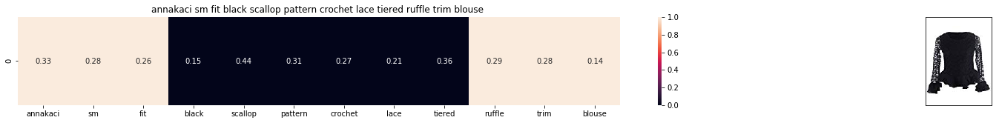

ASIN : B00O194W8W
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.0459904789057266


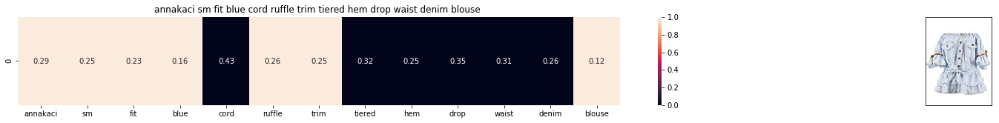

ASIN : B0759G15ZX
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.0670382891349643


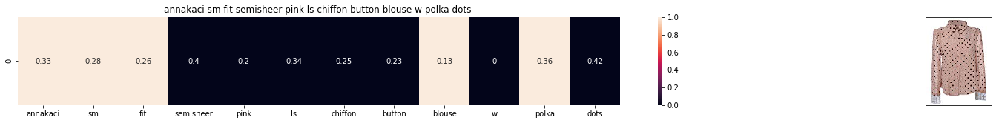

ASIN : B008Z5ST3C
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.079194342831273


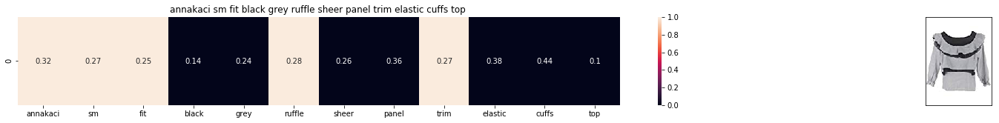

ASIN : B00OIBU11K
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.0810642547494658


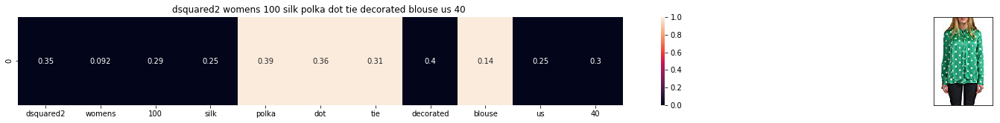

ASIN : B01AYBH28M
BRAND : DSQUARED2
Eucliden distance from the given image : 1.1040520792000035


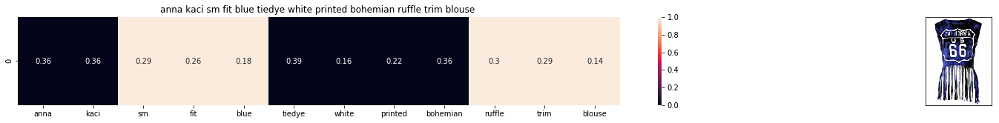

ASIN : B00YQ8S4K0
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.1106318669558235


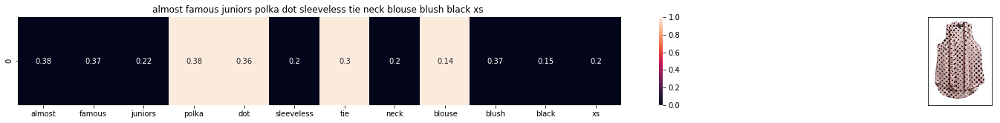

ASIN : B0745J9HNS
BRAND : Almost Famous
Eucliden distance from the given image : 1.1114784382103975


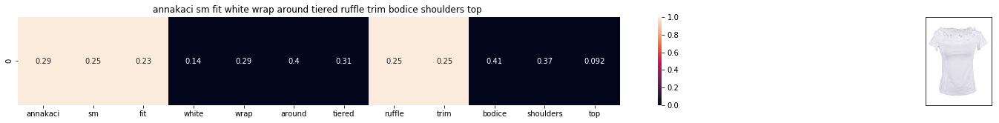

ASIN : B00LMKGFS8
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.113963394862801


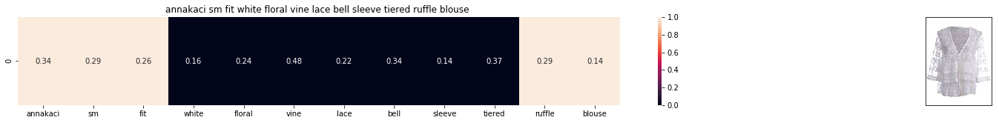

ASIN : B00DVOAWM8
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.115670616192694


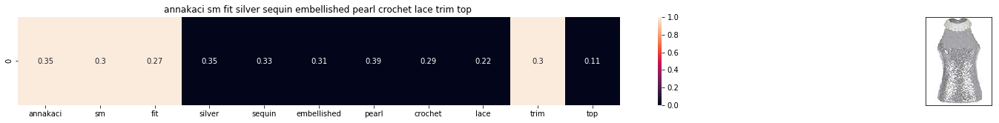

ASIN : B00OPFYBXI
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.1246975675554731


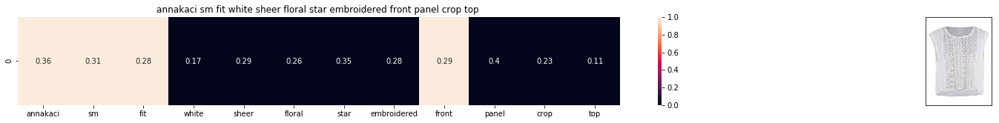

ASIN : B00NAB1R8A
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.124773884923174


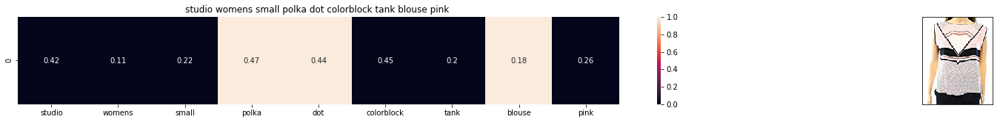

ASIN : B0721KC2HT
BRAND : Studio M
Eucliden distance from the given image : 1.129816389682597


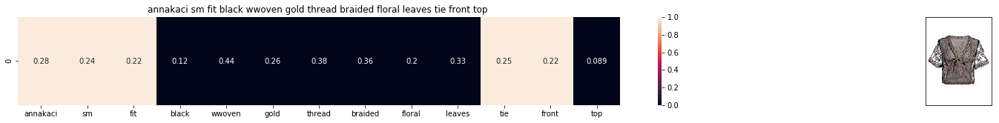

ASIN : B00E7Z8DWQ
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.13146940297404


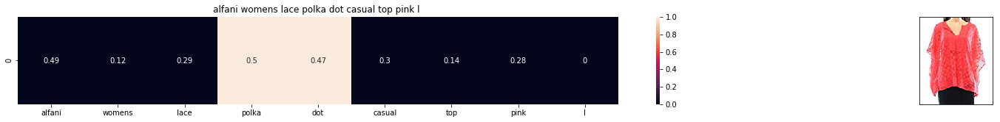

ASIN : B07125NJJ2
BRAND : Alfani
Eucliden distance from the given image : 1.1325545037426967


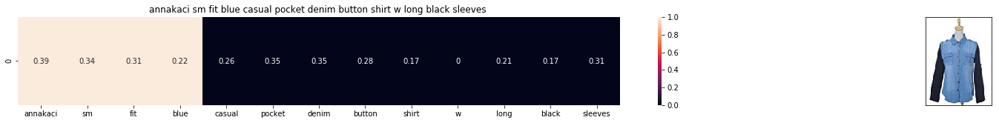

ASIN : B0097LQOOY
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.134493010198643


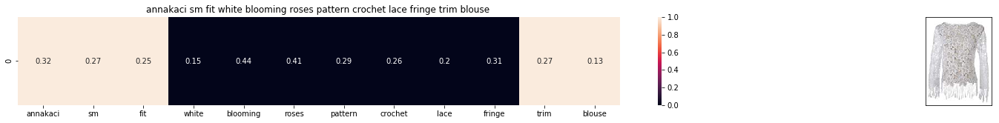

ASIN : B00RDLAR2A
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.1394888920467072


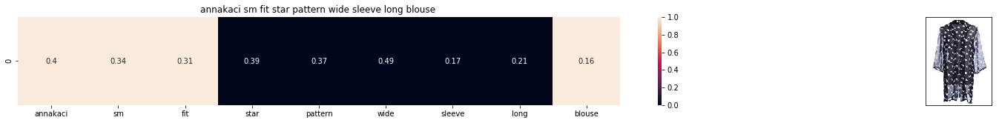

ASIN : B00G5RYY18
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.1474660726278398


In [40]:
def tfidf_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(tfidf_title_features,tfidf_title_features[doc_id])

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i], data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'tfidf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('Eucliden distance from the given image :', pdists[i])
        print('='*125)
tfidf_model(931, 20)
# in the output heat map each value represents the tfidf values of the label word, the color represents the intersection with inputs title

## [8.5] IDF based product similarity

In [32]:
idf_title_vectorizer = CountVectorizer()
idf_title_features = idf_title_vectorizer.fit_transform(data['title'])


In [33]:
idf_title_features

<16042x12609 sparse matrix of type '<class 'numpy.int64'>'
	with 147545 stored elements in Compressed Sparse Row format>

In [34]:
def n_containing(word):
    return sum(1 for blob in data['title'] if word in blob.split())
def idf(word):
    return math.log(data.shape[0]/(n_containing(word)))

In [37]:
# we need to convert the values into float
idf_title_features  = idf_title_features.astype(np.float)

for i in tqdm(idf_title_vectorizer.vocabulary_.keys()):
    # for every word in whole corpus we will find its idf value
    idf_val = idf(i)
    
    # to calculate idf_title_features we need to replace the count values with the idf values of the word
    # idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0] will return all documents in which the word i present
    for j in idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0]:
        
        # we replace the count values of word i in document j with  idf_value of word i 
        # idf_title_features[doc_id, index_of_word_in_courpus] = idf value of word
        idf_title_features[j,idf_title_vectorizer.vocabulary_[i]] = idf_val
        

100%|████████████████████████████████████████████████████████████████████████████| 12609/12609 [03:20<00:00, 67.73it/s]


In [36]:
from tqdm import tqdm

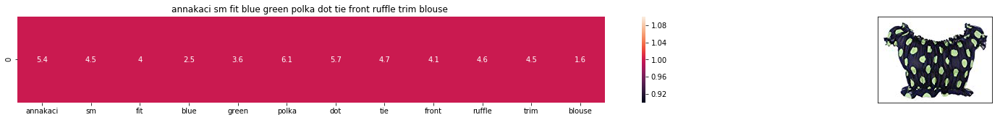

ASIN : B00KLHUIBS
Brand : Anna-Kaci
euclidean distance from the given image : 0.0


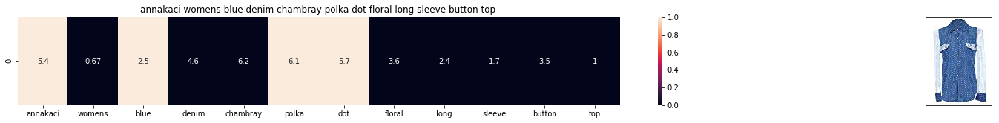

ASIN : B008SMIFN6
Brand : Anna-Kaci
euclidean distance from the given image : 15.046151721911697


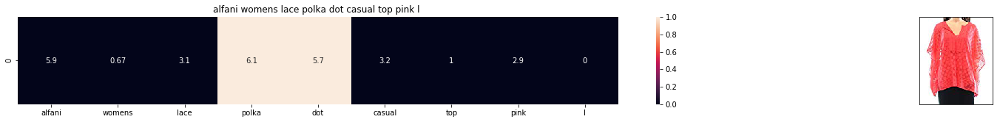

ASIN : B07125NJJ2
Brand : Alfani
euclidean distance from the given image : 15.222769212649535


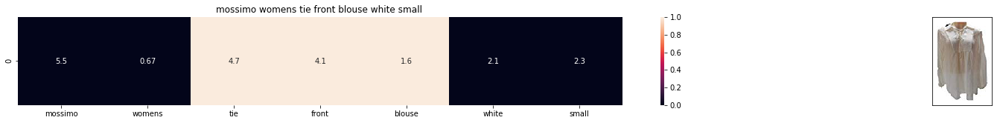

ASIN : B07111HHX6
Brand : Mossimo
euclidean distance from the given image : 15.3415518161122


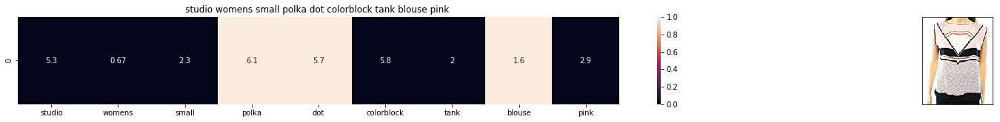

ASIN : B0721KC2HT
Brand : Studio M
euclidean distance from the given image : 15.627349276848992


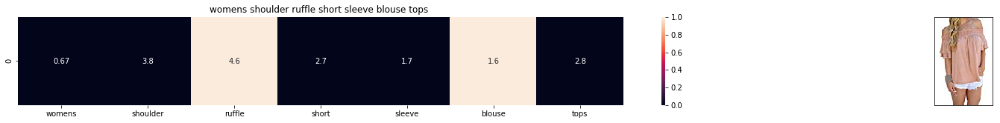

ASIN : B01KXEE20Q
Brand : ouwoow
euclidean distance from the given image : 15.685249209812426


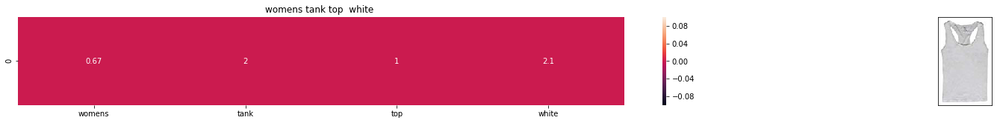

ASIN : B00JPOZ9GM
Brand : Sofra
euclidean distance from the given image : 15.698624105009333


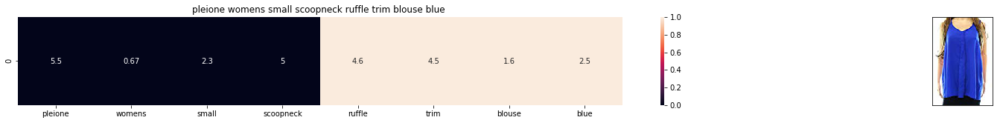

ASIN : B072VHTT1D
Brand : Pleione
euclidean distance from the given image : 15.733159164541727


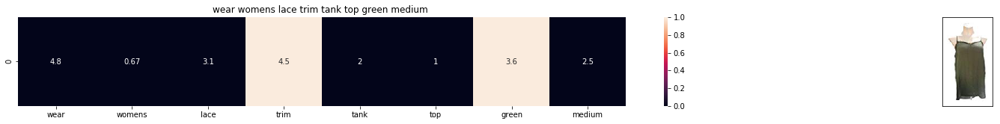

ASIN : B0722TS9DK
Brand : Who What Wear
euclidean distance from the given image : 15.746519642051068


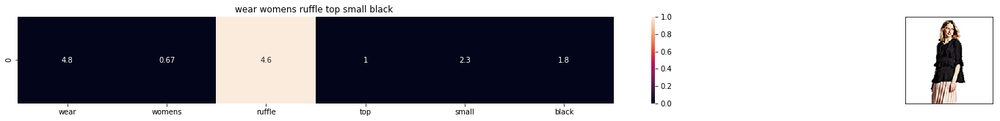

ASIN : B07258X2FK
Brand : Who What Wear
euclidean distance from the given image : 15.76861658770721


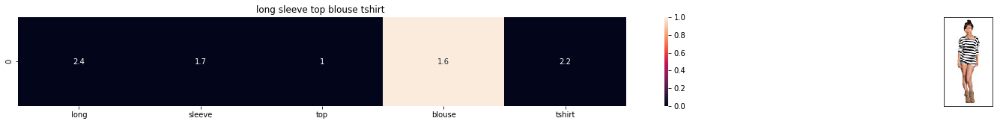

ASIN : B00KF2N5PU
Brand : Vietsbay
euclidean distance from the given image : 15.769570727563098


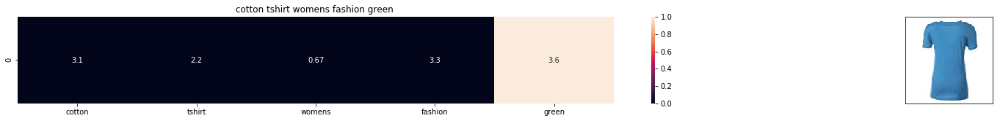

ASIN : B073GJGVBN
Brand : Ivan Levi
euclidean distance from the given image : 15.811562821616887


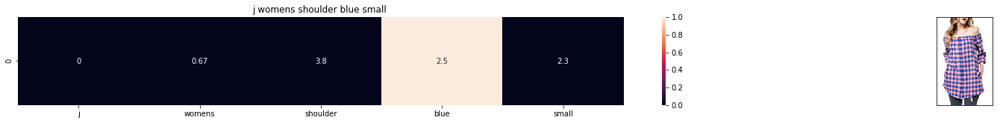

ASIN : B07583CQFT
Brand : Very J
euclidean distance from the given image : 15.83828054738109


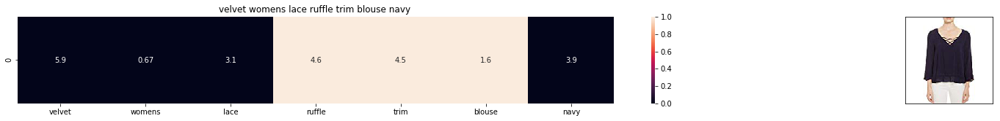

ASIN : B06XCZGQLP
Brand : Velvet by Graham & Spencer
euclidean distance from the given image : 15.878781785172018


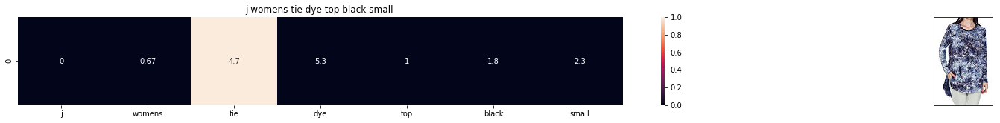

ASIN : B075831F14
Brand : Very J
euclidean distance from the given image : 15.928749759426031


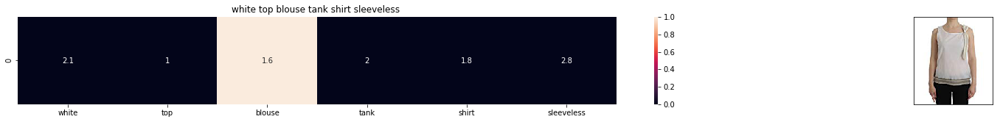

ASIN : B074G5G5RK
Brand : ERMANNO SCERVINO
euclidean distance from the given image : 15.953279501032116


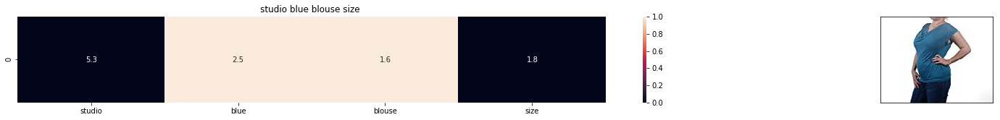

ASIN : B016P80OKQ
Brand : Studio M
euclidean distance from the given image : 16.078823245515473


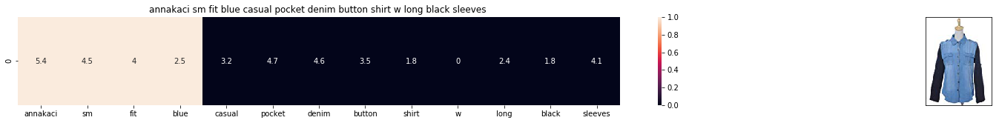

ASIN : B0097LQOOY
Brand : Anna-Kaci
euclidean distance from the given image : 16.11978163937991


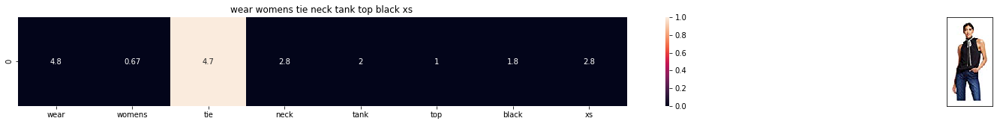

ASIN : B071RYB16J
Brand : Who What Wear
euclidean distance from the given image : 16.18992757930191


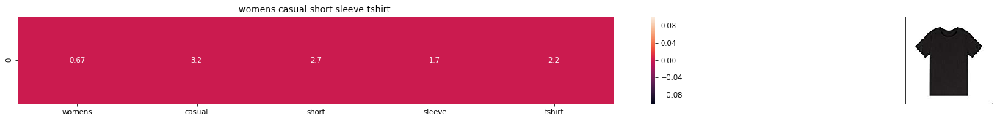

ASIN : B074T9KG9Q
Brand : Rain
euclidean distance from the given image : 16.20255923081081


In [85]:
def idf_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(idf_title_features,idf_title_features[doc_id])

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'idf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from the given image :', pdists[i])
        print('='*125)

        
        
idf_model(931,20)
# in the output heat map each value represents the idf values of the label word, the color represents the intersection with inputs title

# Text Based Product Similarity

In [ ]:

'''
# Set values for various parameters
num_features = 300    # Word vector dimensionality                      
min_word_count = 1    # Minimum word count                        
num_workers = 4       # Number of threads to run in parallel
context = 10          # Context window size                                                                                    
downsampling = 1e-3   # Downsample setting for frequent words

# Initialize and train the model (this will take some time)
from gensim.models import word2vec
print ("Training model...")
model = word2vec.Word2Vec(sen_corpus, workers=num_workers, \
            size=num_features, min_count = min_word_count, \
            window = context)
    
'''

In [38]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

'''
model = KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)
'''

#if you do NOT have RAM >= 12GB, use the code below.
with open('word2vec_model', 'rb') as handle:
    model = pickle.load(handle)


In [39]:

def get_word_vec(sentence, doc_id, m_name):
    # sentence : title of the apparel
    # doc_id: document id in our corpus
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)
    vec = []
    for i in sentence.split():
        if i in vocab:
            if m_name == 'weighted' and i in  idf_title_vectorizer.vocabulary_:
                vec.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            elif m_name == 'avg':
                vec.append(model[i])
        else:
            # if the word in our courpus is not there in the google word2vec corpus, we are just ignoring it
            vec.append(np.zeros(shape=(300,)))
    # we will return a numpy array of shape (#number of words in title * 300 ) 300 = len(w2v_model[word])
    # each row represents the word2vec representation of each word (weighted/avg) in given sentance 
    return  np.array(vec)

def get_distance(vec1, vec2):
    # vec1 = np.array(#number_of_words_title1 * 300), each row is a vector of length 300 corresponds to each word in give title
    # vec2 = np.array(#number_of_words_title2 * 300), each row is a vector of length 300 corresponds to each word in give title
    
    final_dist = []
    # for each vector in vec1 we caluclate the distance(euclidean) to all vectors in vec2
    for i in vec1:
        dist = []
        for j in vec2:
            # np.linalg.norm(i-j) will result the euclidean distance between vectors i, j
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    # final_dist = np.array(#number of words in title1 * #number of words in title2)
    # final_dist[i,j] = euclidean distance between vectors i, j
    return np.array(final_dist)


def heat_map_w2v(sentence1, sentence2, url, doc_id1, doc_id2, model):
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentence1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentence2, doc_id2, model)

    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)

    
    
    
    # devide whole figure into 2 parts 1st part displays heatmap 2nd part displays image of apparel
    gs = gridspec.GridSpec(2, 2, width_ratios=[4,1],height_ratios=[2,1]) 
    fig = plt.figure(figsize=(15,15))
    
    ax = plt.subplot(gs[0])
    # ploting the heap map based on the pairwise distances
    ax = sns.heatmap(np.round(s1_s2_dist,4), annot=True)
    # set the x axis labels as recommended apparels title
    ax.set_xticklabels(sentence2.split())
    # set the y axis labels as input apparels title
    ax.set_yticklabels(sentence1.split())
    # set title as recommended apparels title
    ax.set_title(sentence2)
    
    ax = plt.subplot(gs[1])
    # we remove all grids and axis labels for image
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    display_img(url, ax, fig)
    
    plt.show()

In [40]:
vocab = model.keys()
def build_avg_vec(sentence,num_features,doc_id,m_name):
    featureVec = np.zeros((num_features,), dtype = "float32")
    nword = 0
    for word in sentence.split():
        nword+=1
        if word in vocab:
            if m_name == 'weighted' and word in idf_title_vectorizer.vocabulary_:
                featureVec = np.add(featureVec, idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
            elif m_name == 'avg':
                featureVec = np.add(featureVec, model[word])
    if(nword>0):
        featureVec = np.divide(featureVec, nword)
    # returns the avg vector of given sentance, its of shape (1, 300)
    return featureVec

In [41]:
doc_id=0
w2v_title = []
for i in data['title']:
    w2v_title.append(build_avg_vec(i,300,doc_id,'avg'))
    doc_id +=1
w2v_title  = np.array(w2v_title)    

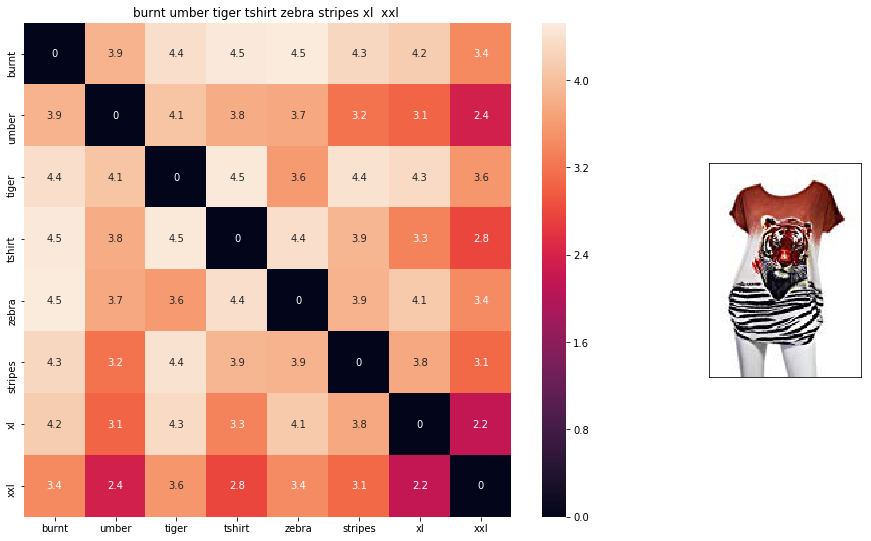

ASIN : B00JXQB5FQ
BRAND : Si Row
euclidean distance from given input image : 0.00069053395


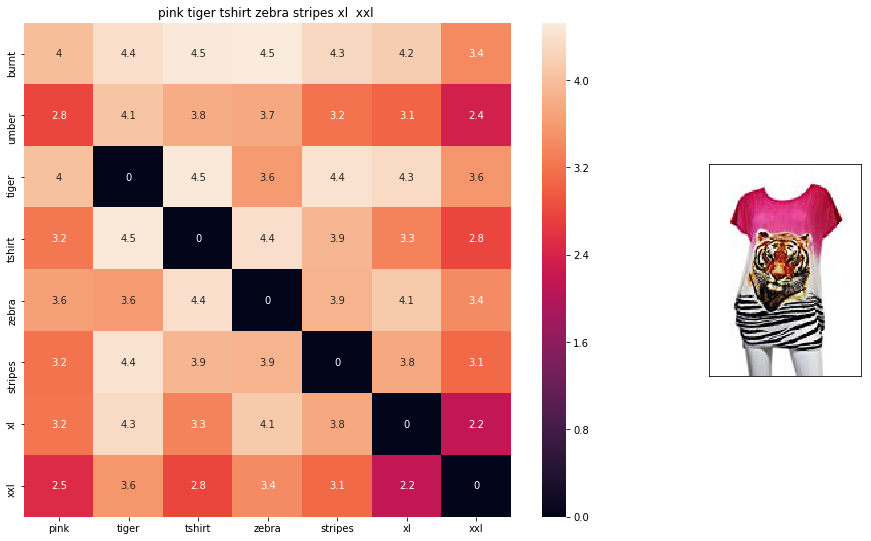

ASIN : B00JXQASS6
BRAND : Si Row
euclidean distance from given input image : 0.5891932


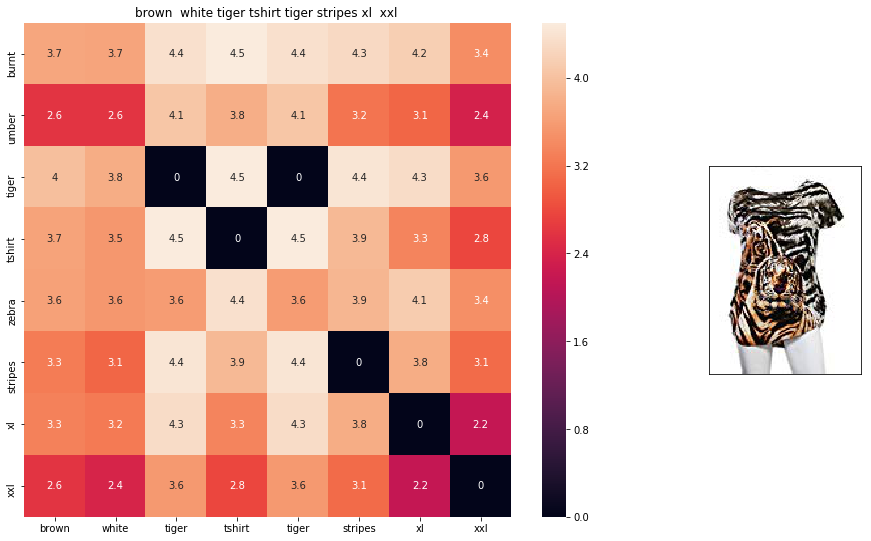

ASIN : B00JXQCWTO
BRAND : Si Row
euclidean distance from given input image : 0.7003439


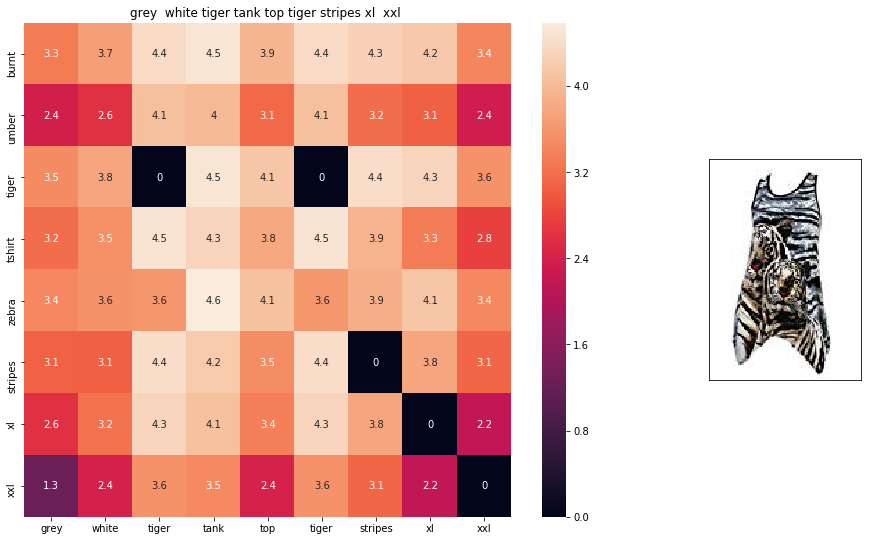

ASIN : B00JXQAFZ2
BRAND : Si Row
euclidean distance from given input image : 0.8928398


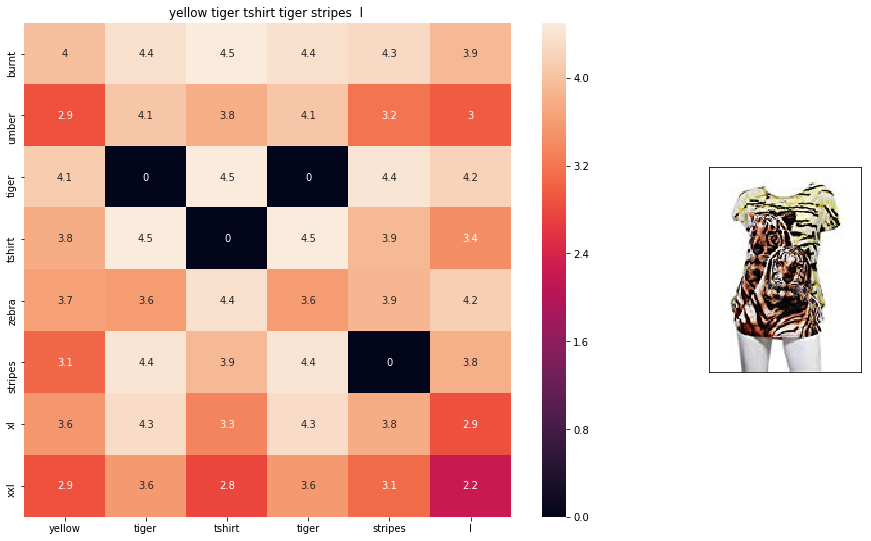

ASIN : B00JXQCUIC
BRAND : Si Row
euclidean distance from given input image : 0.95601267


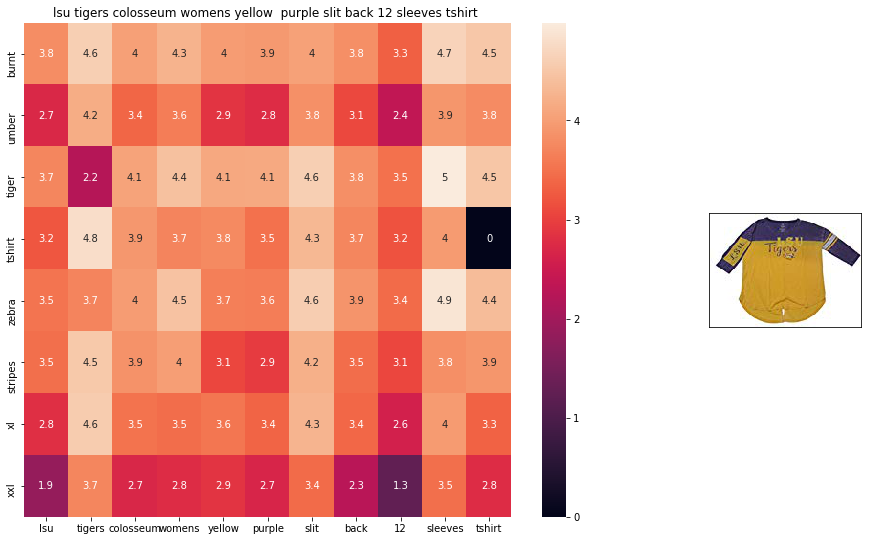

ASIN : B073R5Q8HD
BRAND : Colosseum
euclidean distance from given input image : 1.0229691


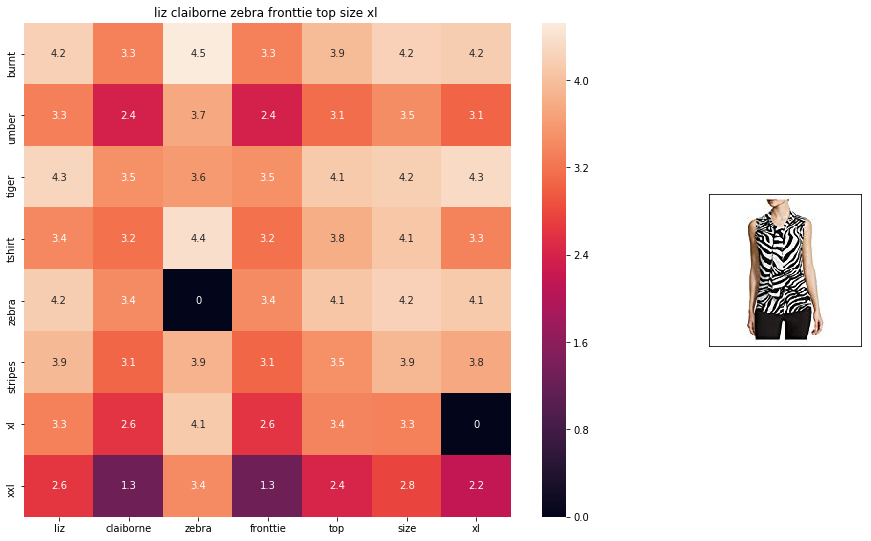

ASIN : B06XBY5QXL
BRAND : Liz Claiborne
euclidean distance from given input image : 1.0669324


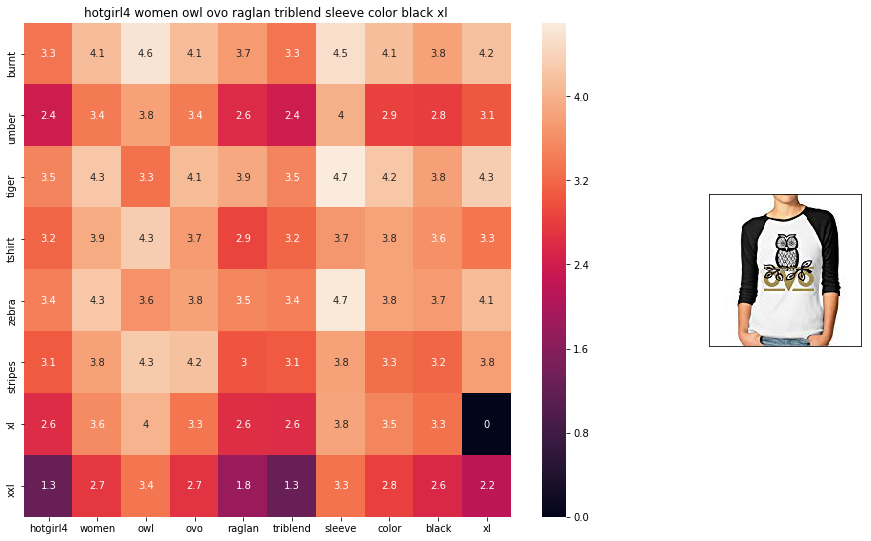

ASIN : B01L8L73M2
BRAND : Hotgirl4 Raglan Design
euclidean distance from given input image : 1.0731405


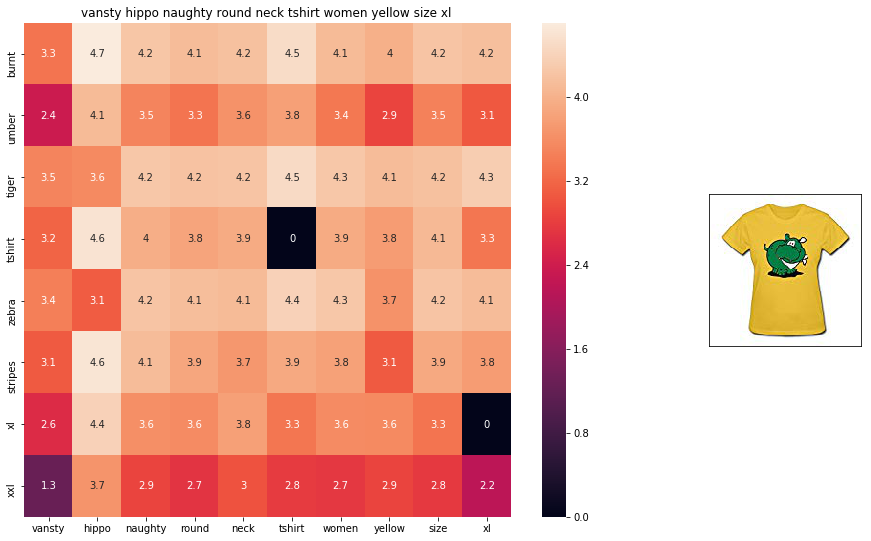

ASIN : B01EJS5H06
BRAND : Vansty
euclidean distance from given input image : 1.075719


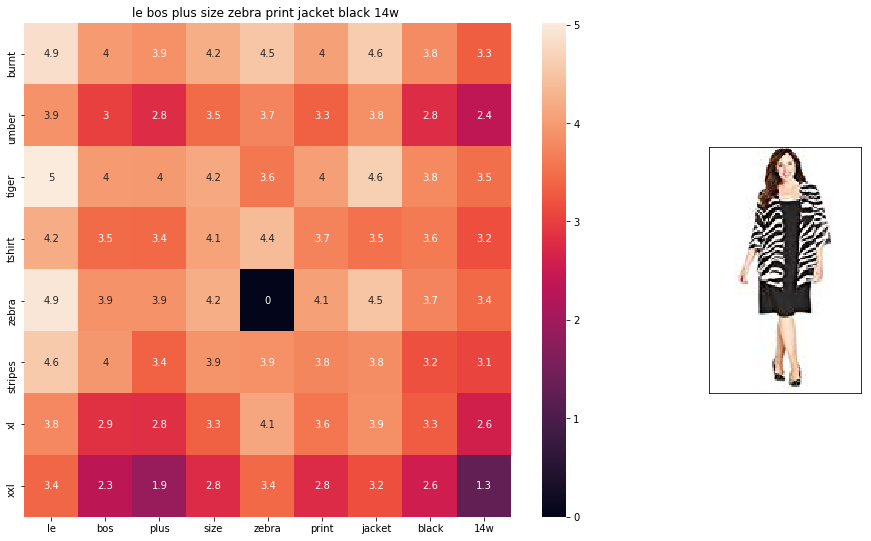

ASIN : B01BO1XRK8
BRAND : Le Bos
euclidean distance from given input image : 1.0839964


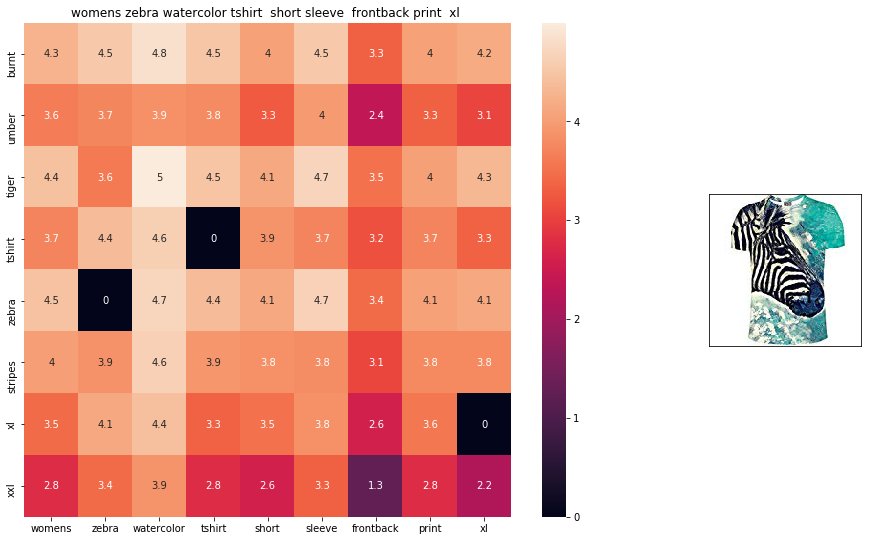

ASIN : B072R2JXKW
BRAND : WHAT ON EARTH
euclidean distance from given input image : 1.0842218


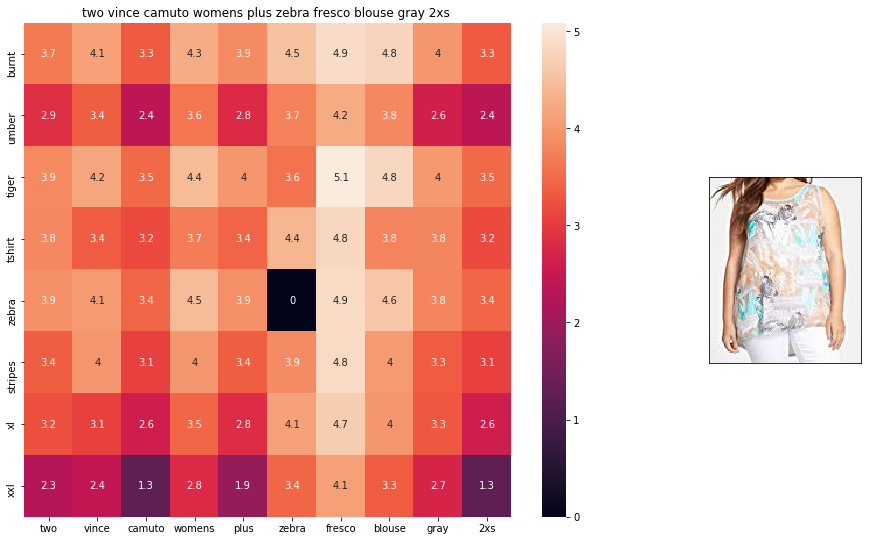

ASIN : B074MJRGW6
BRAND : Two by Vince Camuto
euclidean distance from given input image : 1.0895038


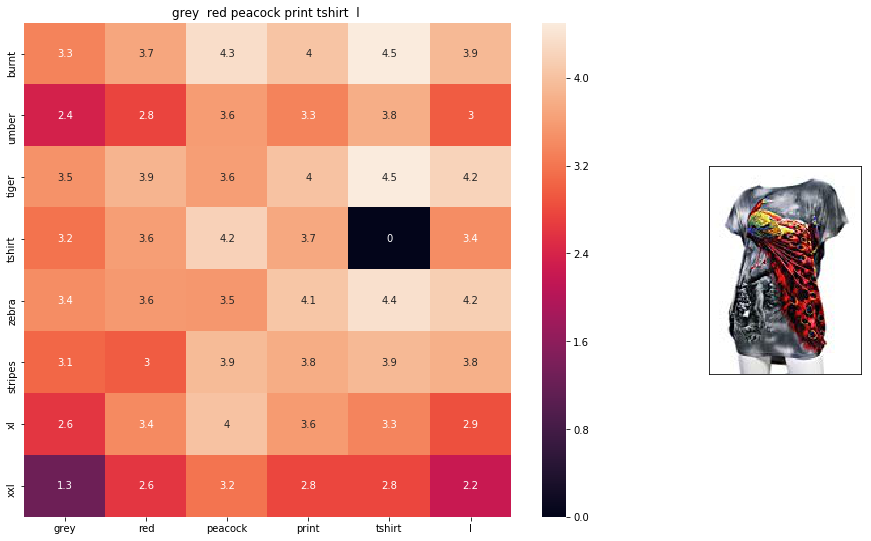

ASIN : B00JXQCFRS
BRAND : Si Row
euclidean distance from given input image : 1.0900588


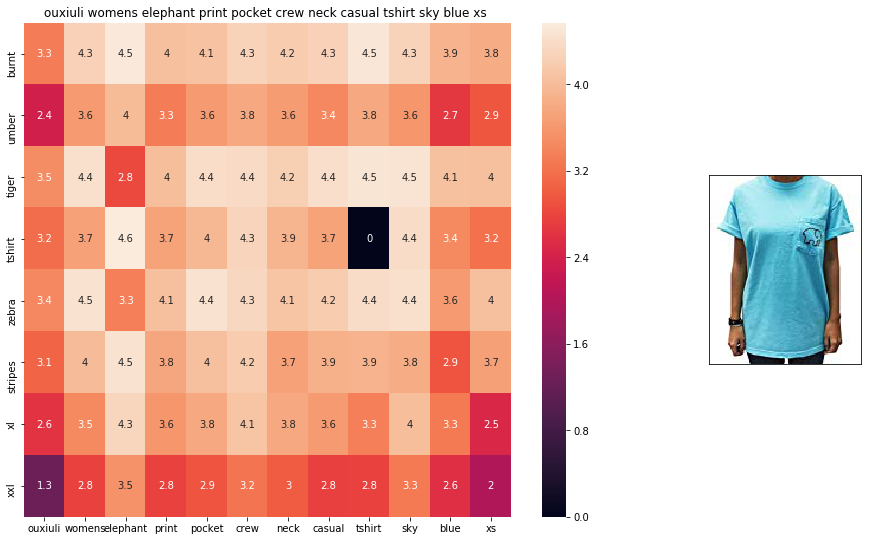

ASIN : B01I53HU6K
BRAND : ouxiuli
euclidean distance from given input image : 1.0920112


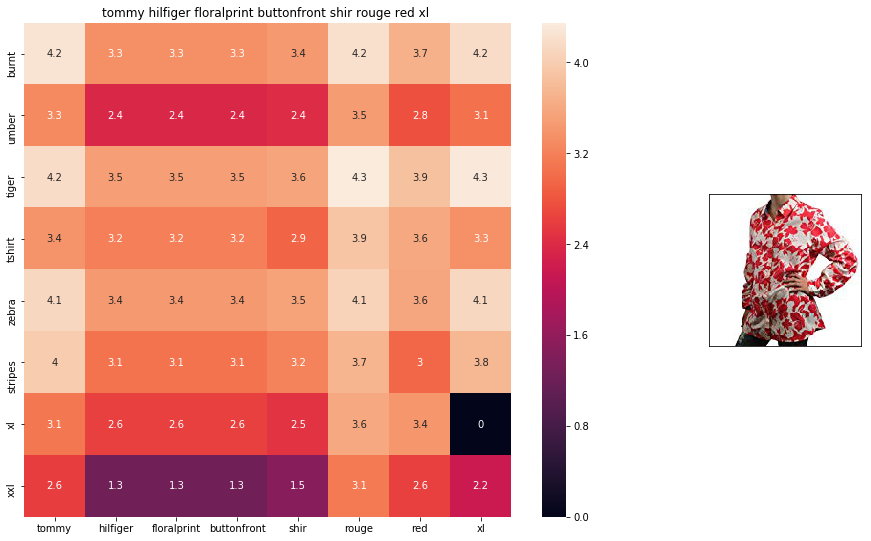

ASIN : B0711NGTQM
BRAND : THILFIGER RTW
euclidean distance from given input image : 1.0923418


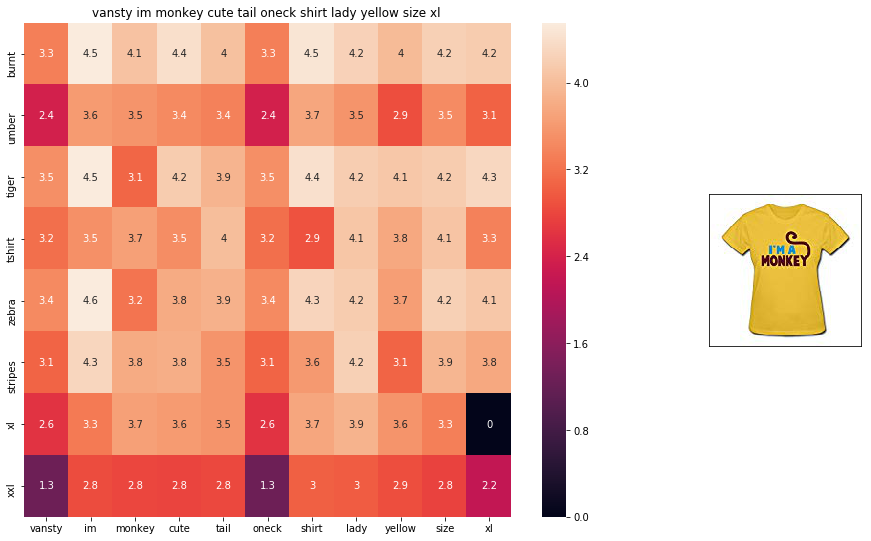

ASIN : B01EFSLO8Y
BRAND : Vansty
euclidean distance from given input image : 1.0934006


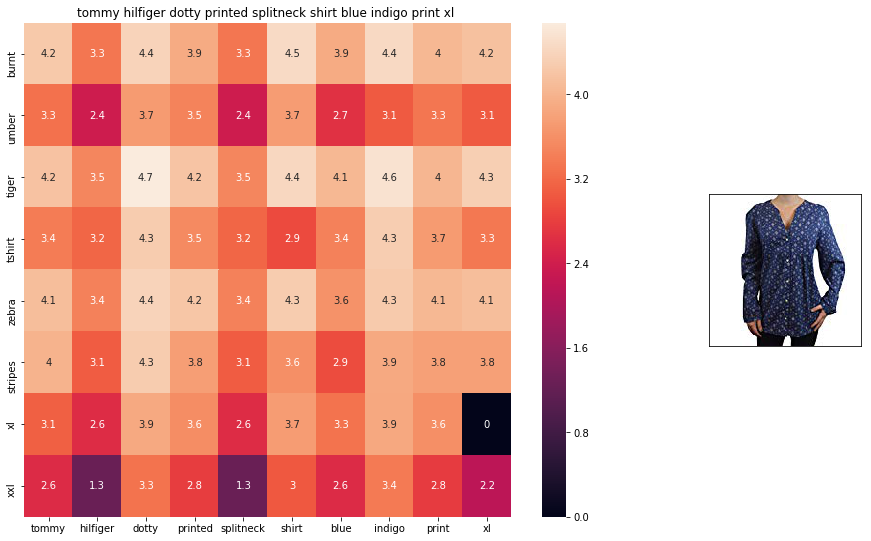

ASIN : B0716TVWQ4
BRAND : THILFIGER RTW
euclidean distance from given input image : 1.0942026


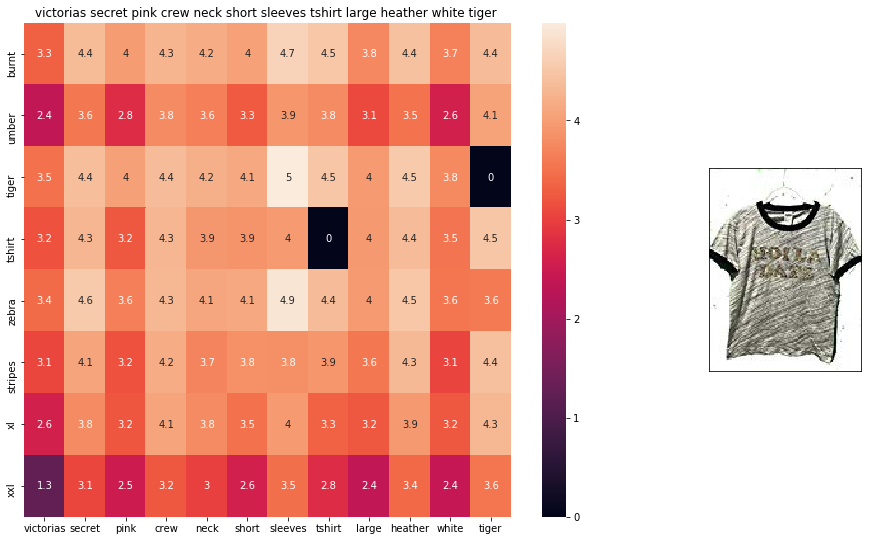

ASIN : B0716MVPGV
BRAND : V.Secret
euclidean distance from given input image : 1.0948305


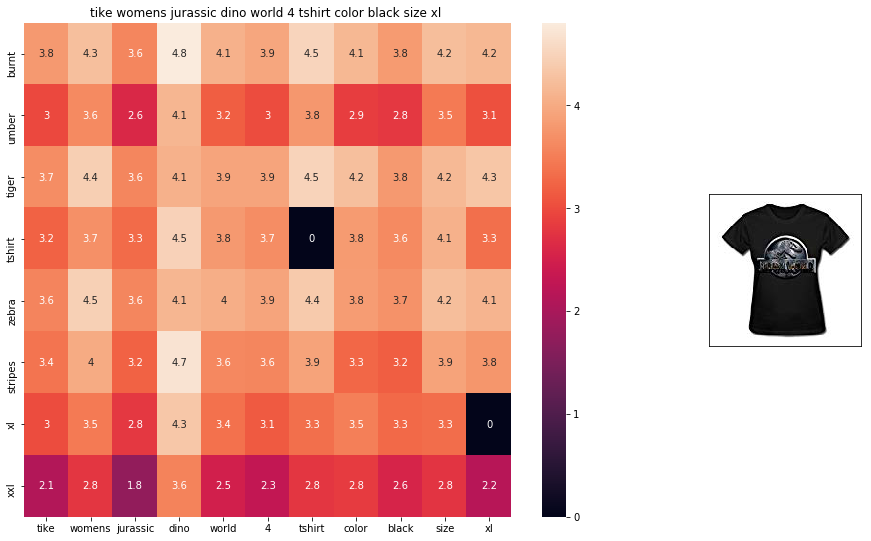

ASIN : B016OPN4OI
BRAND : TIKE Fashions
euclidean distance from given input image : 1.0951275


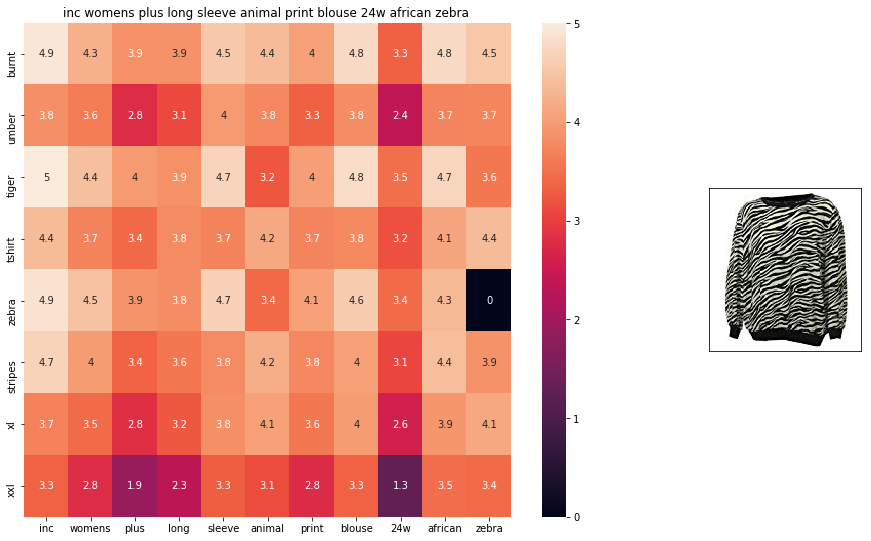

ASIN : B018WDJCUA
BRAND : INC - International Concepts Woman
euclidean distance from given input image : 1.0966892


In [42]:
def avg_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # dist(x, y) = sqrt(dot(x, x) - 2 * dot(x, y) + dot(y, y))
    pairwise_dist = pairwise_distances(w2v_title, w2v_title[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'avg')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from given input image :', pdists[i])
        print('='*125)

        
avg_w2v_model(12566, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

In [66]:
doc_id = 0
w2v_title_weight = []
# for every title we build a weighted vector representation
for i in data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1
# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title_weight = np.array(w2v_title_weight)

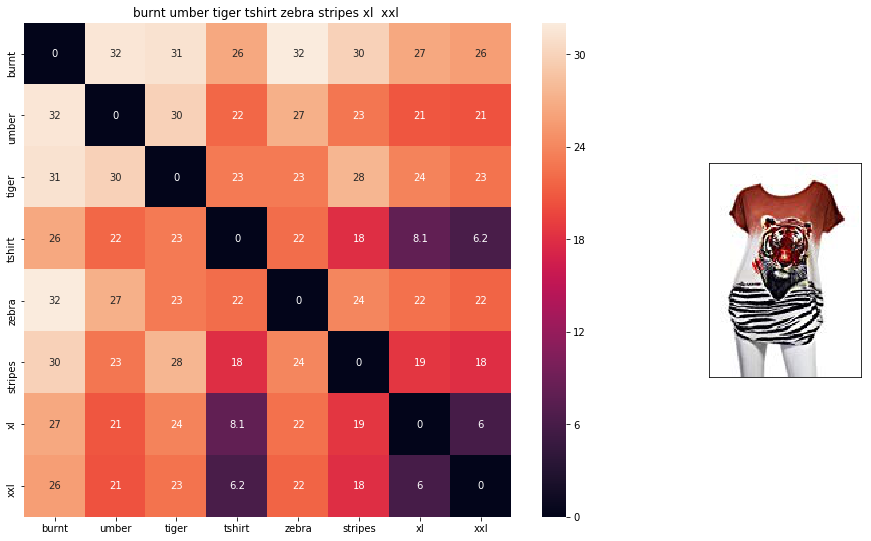

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.00390625


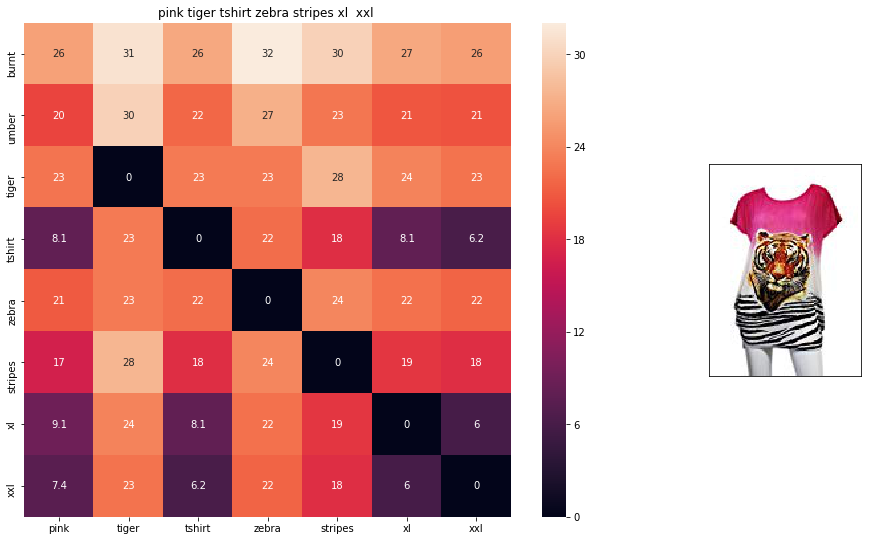

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 4.0638885


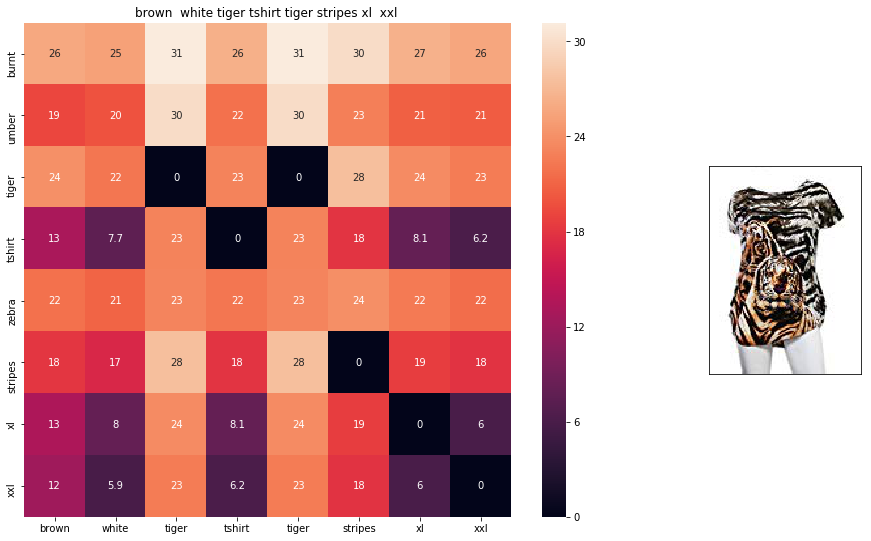

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 4.770942


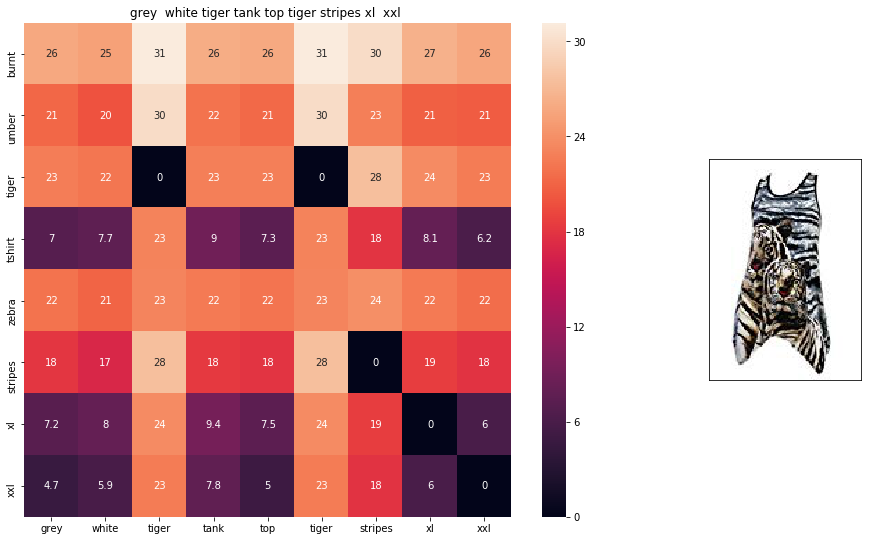

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from input : 5.360161


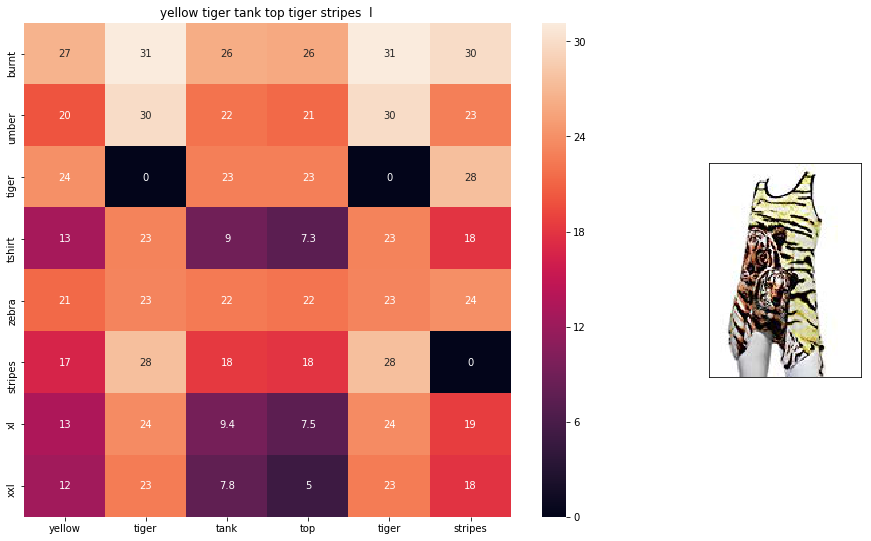

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from input : 5.6895237


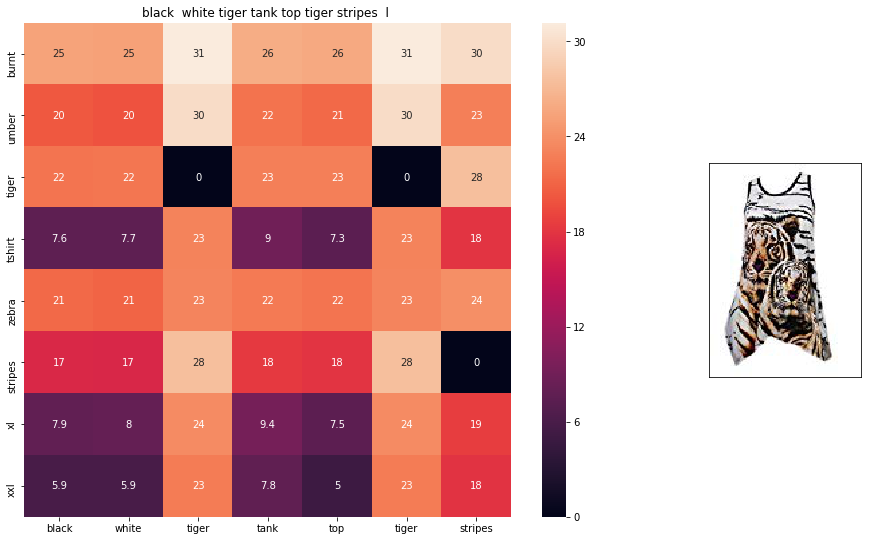

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from input : 5.6930213


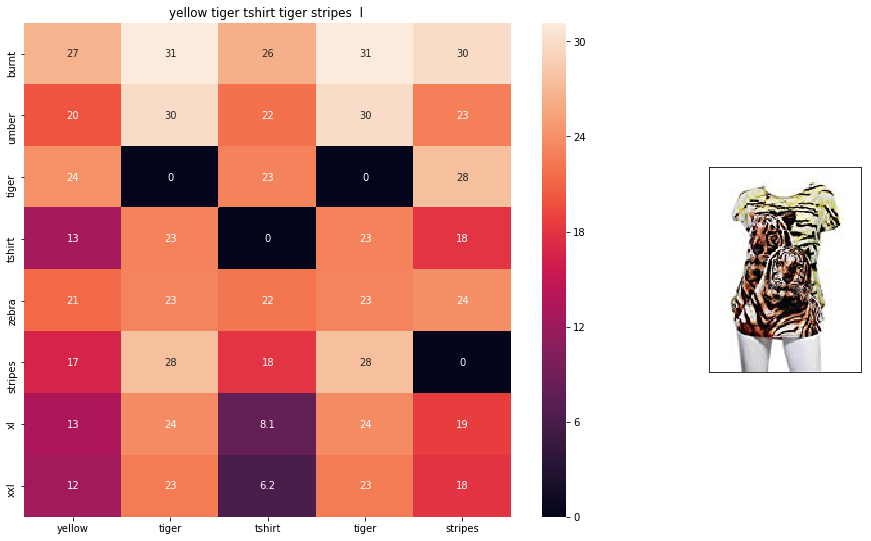

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from input : 5.8934426


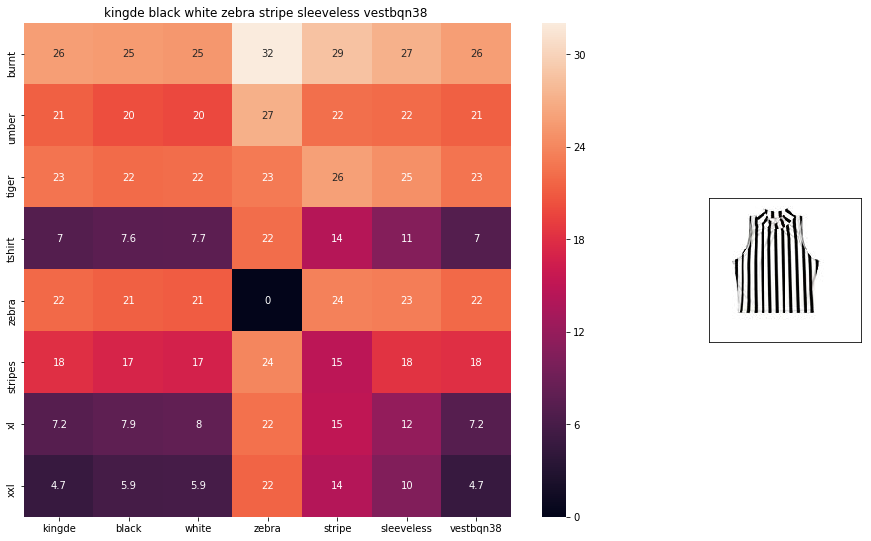

ASIN : B015H41F6G
Brand : KINGDE
euclidean distance from input : 6.13299


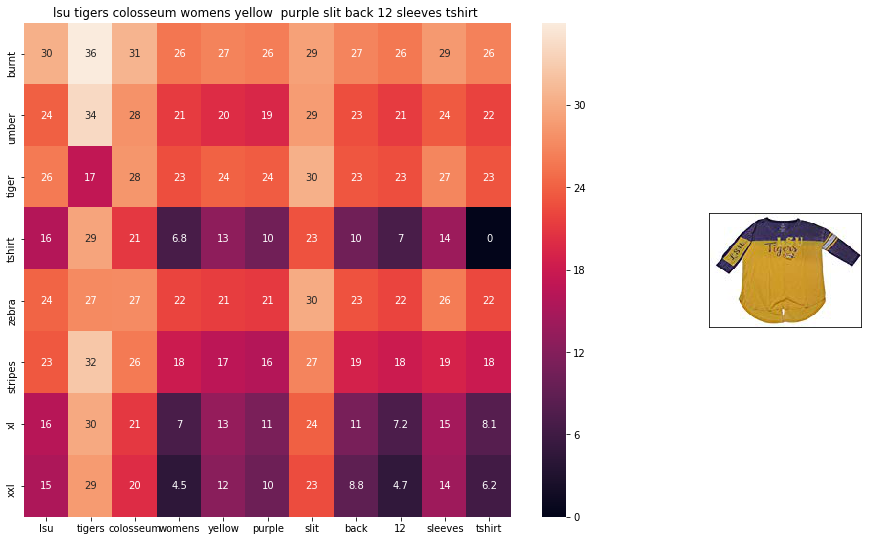

ASIN : B073R5Q8HD
Brand : Colosseum
euclidean distance from input : 6.2567067


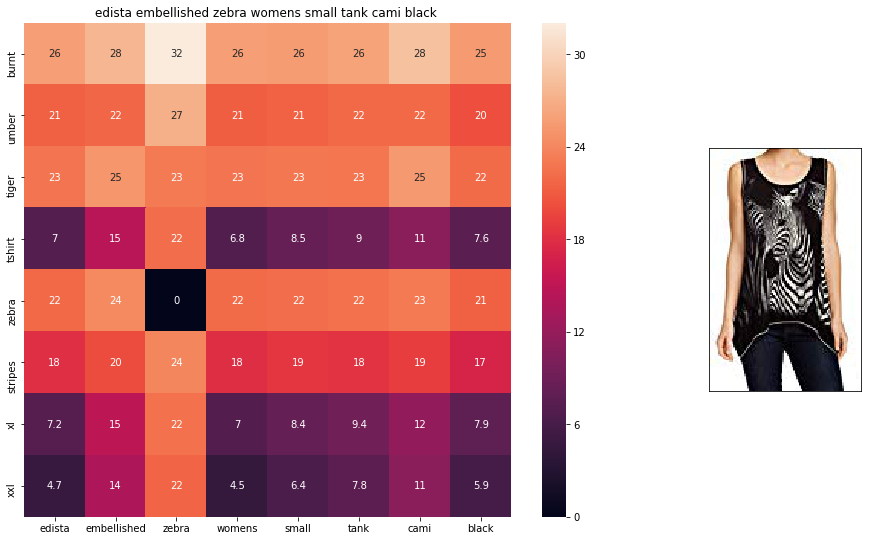

ASIN : B074P8MD22
Brand : Edista
euclidean distance from input : 6.3922043


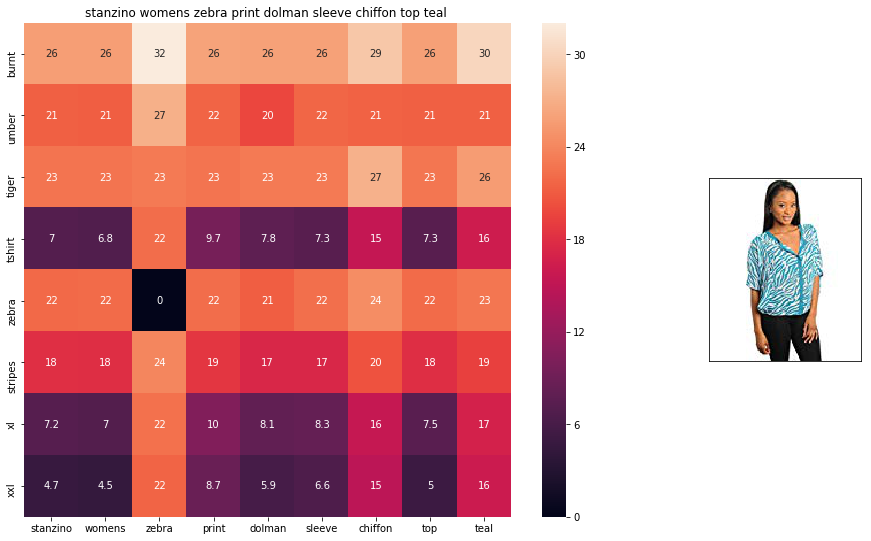

ASIN : B00C0I3U3E
Brand : Stanzino
euclidean distance from input : 6.414901


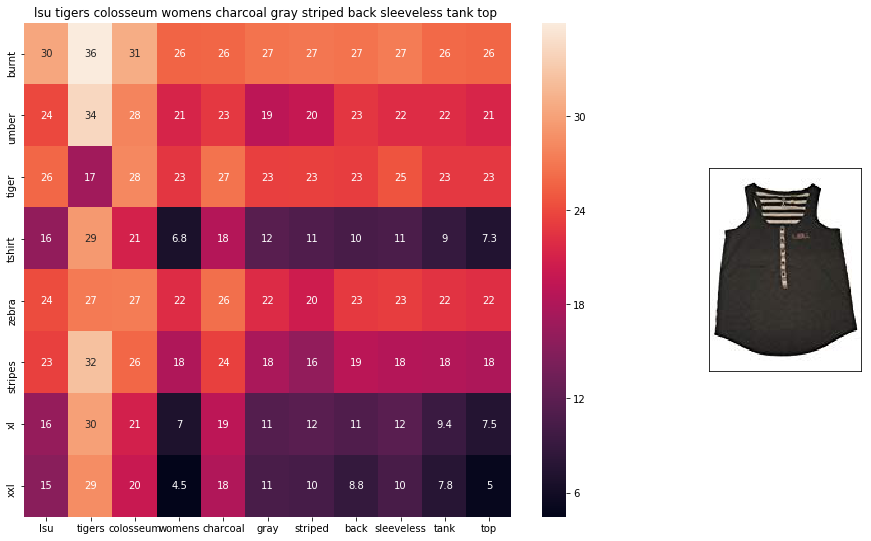

ASIN : B073R4ZM7Y
Brand : Colosseum
euclidean distance from input : 6.45096


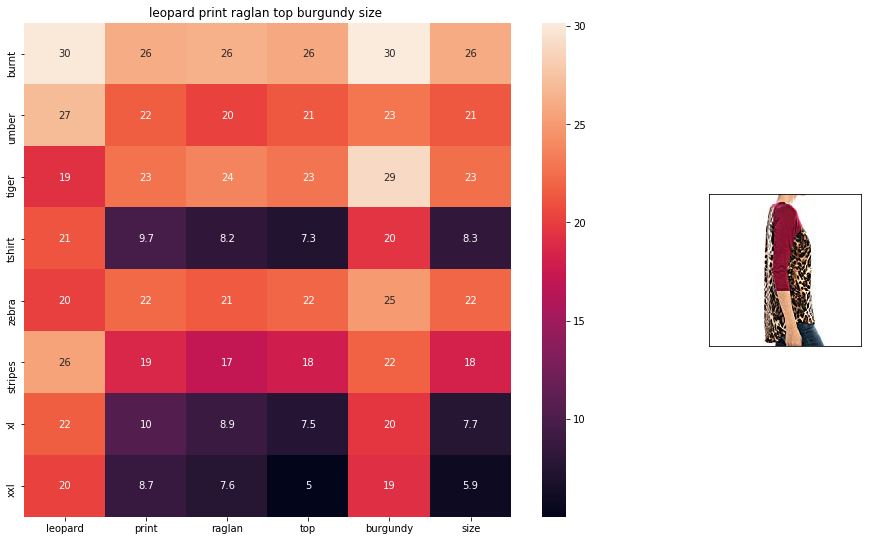

ASIN : B01C6ORLDQ
Brand : 1 Mad Fit
euclidean distance from input : 6.4634094


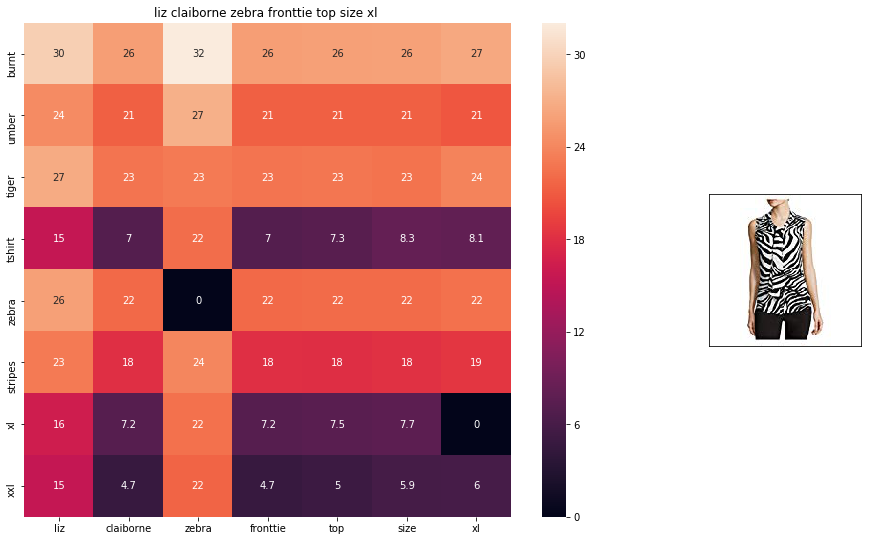

ASIN : B06XBY5QXL
Brand : Liz Claiborne
euclidean distance from input : 6.5392237


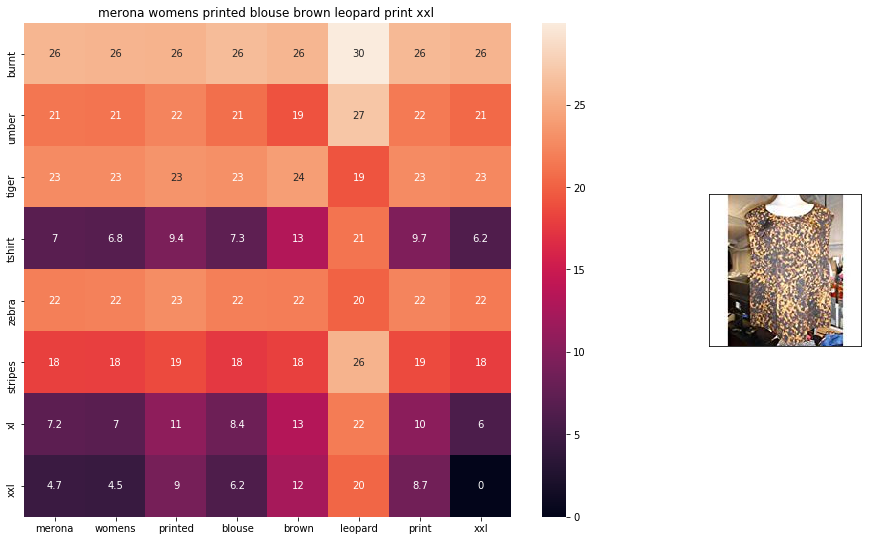

ASIN : B071YF3WDD
Brand : Merona
euclidean distance from input : 6.575504


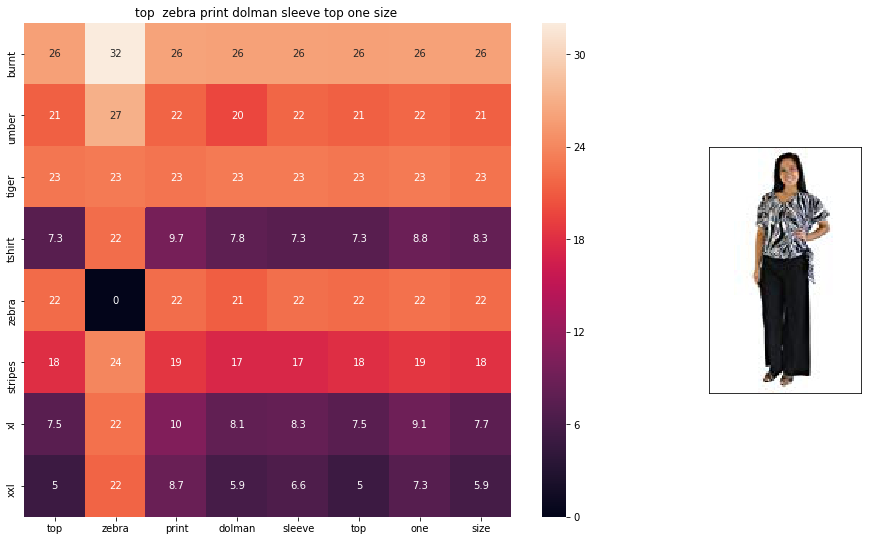

ASIN : B00H8A6ZLI
Brand : Vivian's Fashions
euclidean distance from input : 6.6382155


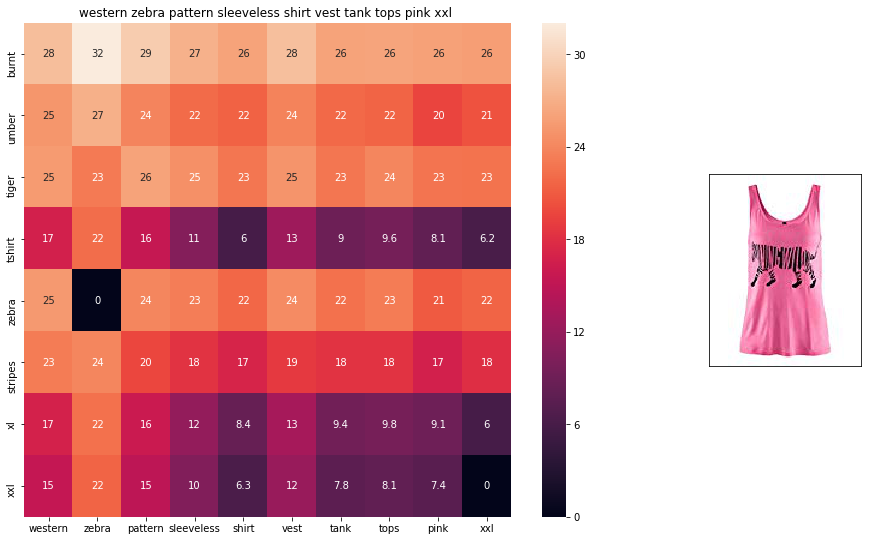

ASIN : B00Z6HEXWI
Brand : Black Temptation
euclidean distance from input : 6.660737


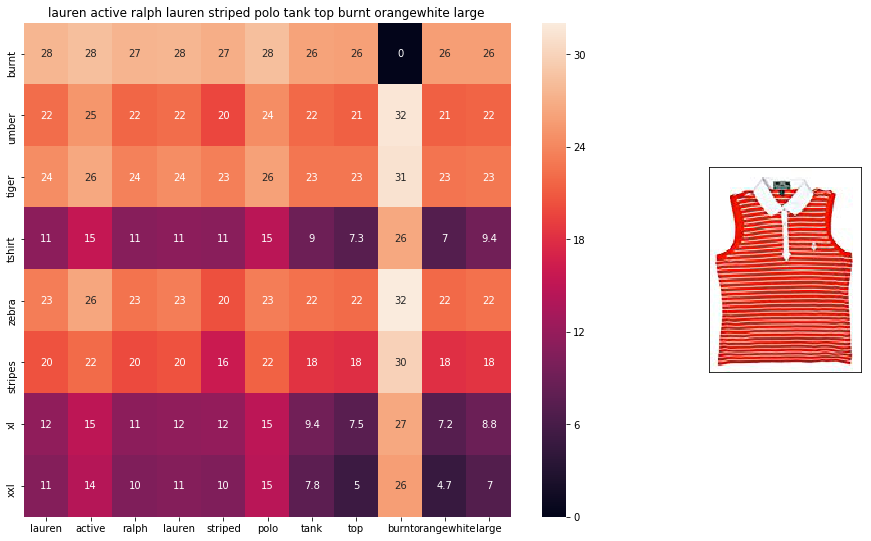

ASIN : B00ILGH5OY
Brand : Ralph Lauren Active
euclidean distance from input : 6.6839056


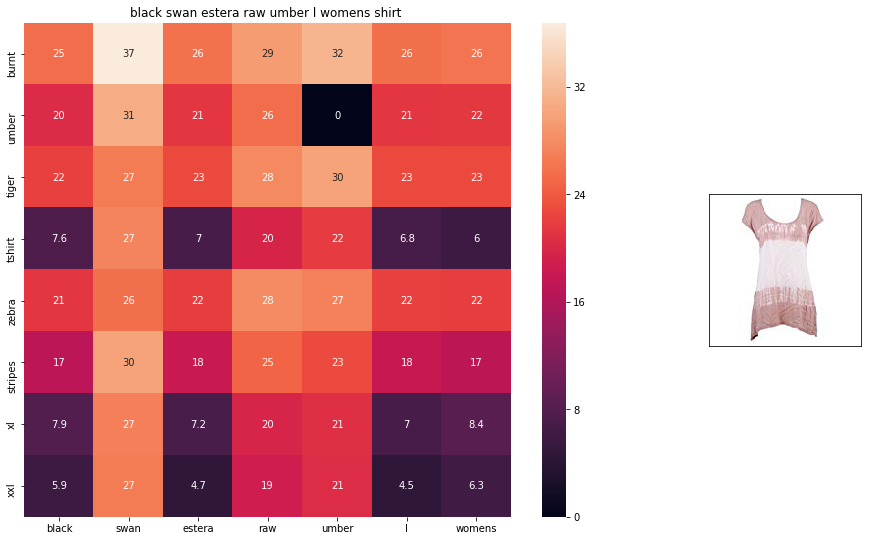

ASIN : B06Y1VN8WQ
Brand : Black Swan
euclidean distance from input : 6.7057643


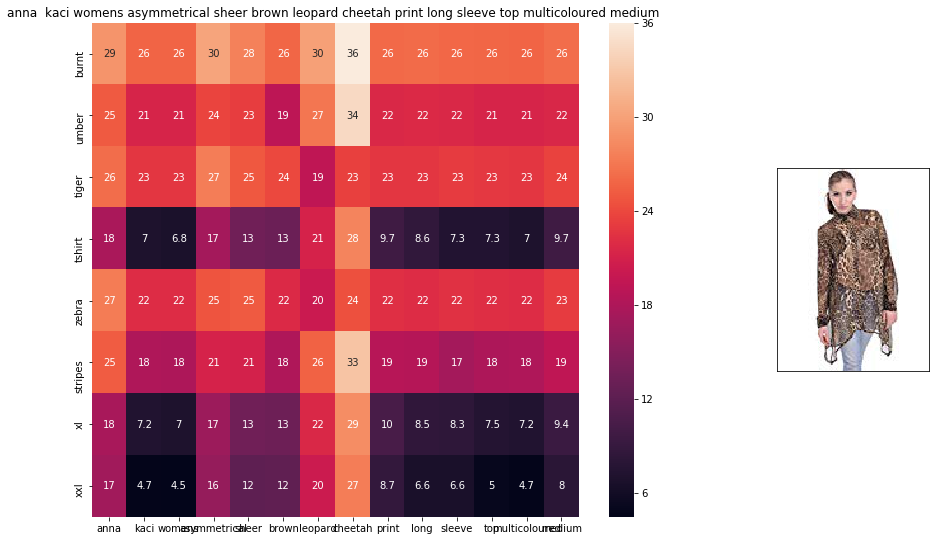

ASIN : B00KSNTY7Y
Brand : Anna-Kaci
euclidean distance from input : 6.706125


In [68]:
def weighted_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

weighted_w2v_model(12566, 20)


# Weighted Similarity using brand and color

In [44]:
data['brand'].fillna(value="Not given", inplace=True )

# replace spaces with hypen
brands = [x.replace(" ", "-") for x in data['brand'].values]
types = [x.replace(" ", "-") for x in data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

type_vectorizer = CountVectorizer()
type_features = type_vectorizer.fit_transform(types)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

extra_features = hstack((brand_features, type_features, color_features)).tocsr()

In [60]:
def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):
    
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # df_id1: index of document1 in the data frame
    # df_id2: index of document2 in the data frame
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title2 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentance2, doc_id2, model)
    
    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)
   
    data_matrix = [['Asin','Brand', 'Color', 'Product type'],
               [data['asin'].loc[df_id1],brands[doc_id1], colors[doc_id1], types[doc_id1]], # input apparel's features
               [data['asin'].loc[df_id2],brands[doc_id2], colors[doc_id2], types[doc_id2]]] # recommonded apparel's features
    
    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] # to color the headings of each column 
    
    # we create a table with the data_matrix
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    # plot it with plotly
    plotly.offline.iplot(table, filename='simple_table')
    
    # devide whole figure space into 25 * 1:10 grids
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,5))
    
    # in first 25*10 grids we plot heatmap
    ax1 = plt.subplot(gs[:, :-5])
    # ploting the heap map based on the pairwise distances
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    # set the x axis labels as recommended apparels title
    ax1.set_xticklabels(sentance2.split())
    # set the y axis labels as input apparels title
    ax1.set_yticklabels(sentance1.split())
    # set title as recommended apparels title
    ax1.set_title(sentance2)

    # in last 25 * 10:15 grids we display image
    ax2 = plt.subplot(gs[:, 10:16])
    # we dont display grid lins and axis labels to images
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # pass the url it display it
    display_img(url, ax2, fig)
    
    plt.show()

In [53]:
w2v_title_weight.shape

(16042, 300)

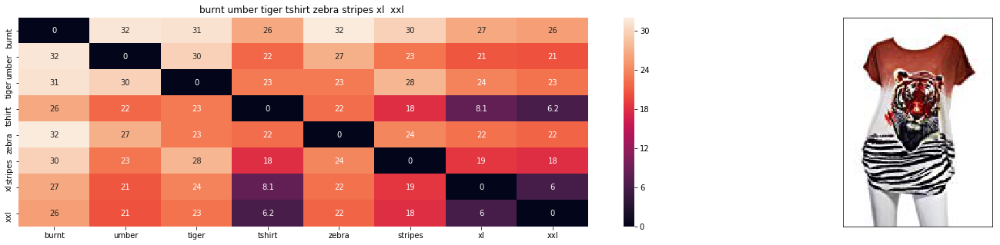

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.001953125


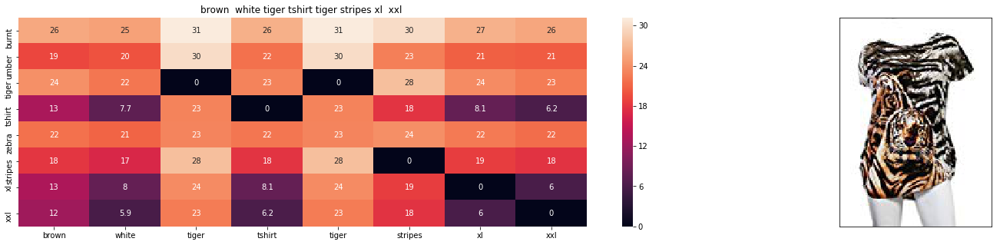

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 2.385471153259277


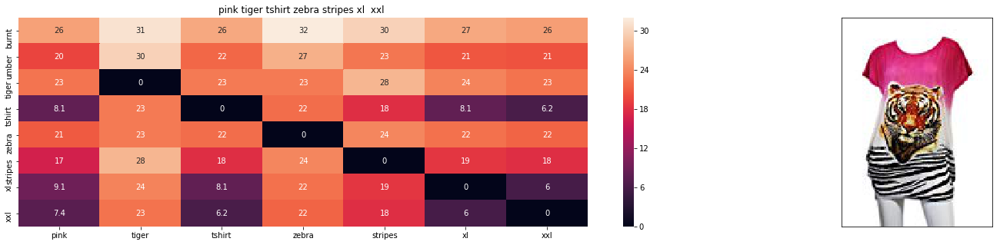

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 2.739051056088891


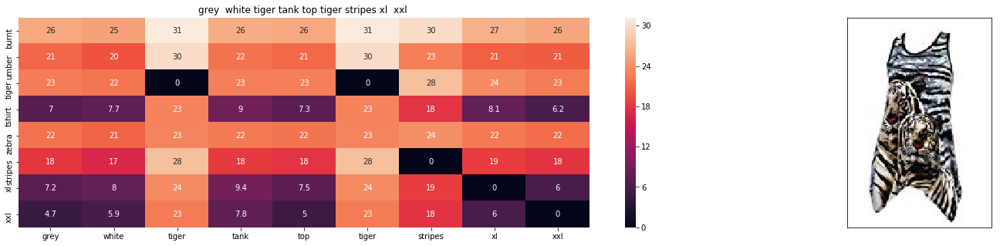

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from input : 3.387187195004907


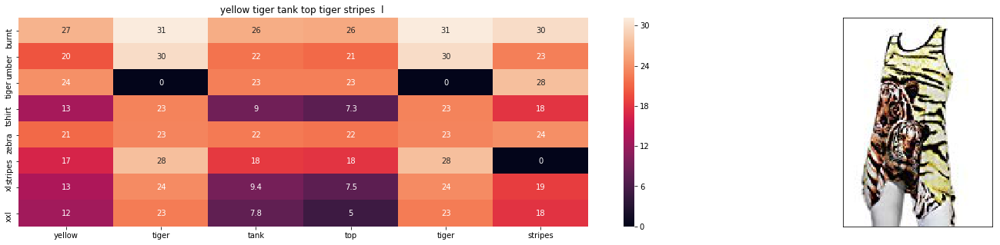

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from input : 3.5518686296362545


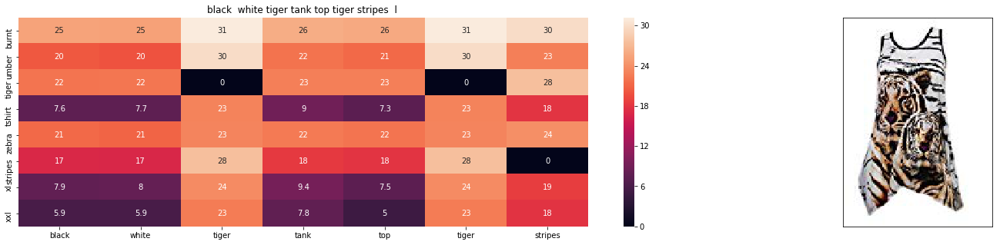

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from input : 3.5536174775976805


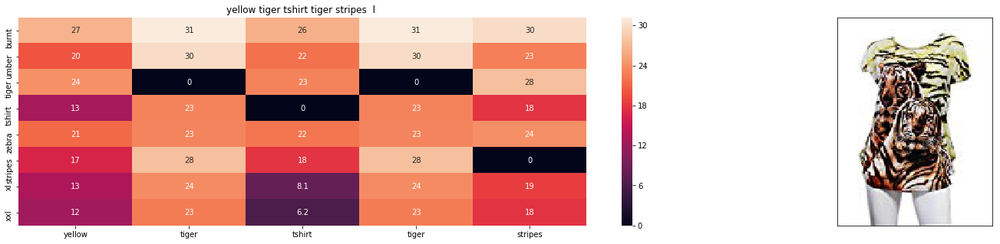

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from input : 3.653828048886743


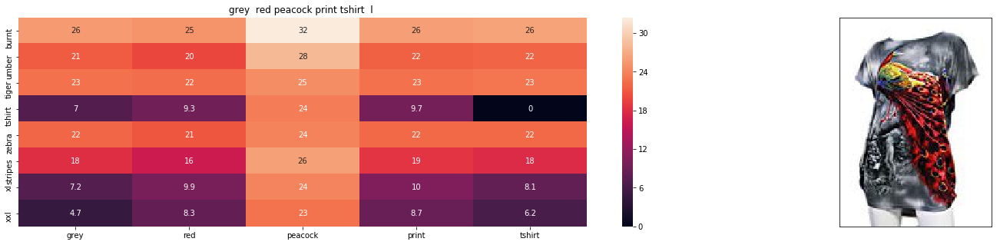

ASIN : B00JXQCFRS
Brand : Si Row
euclidean distance from input : 4.128811645688501


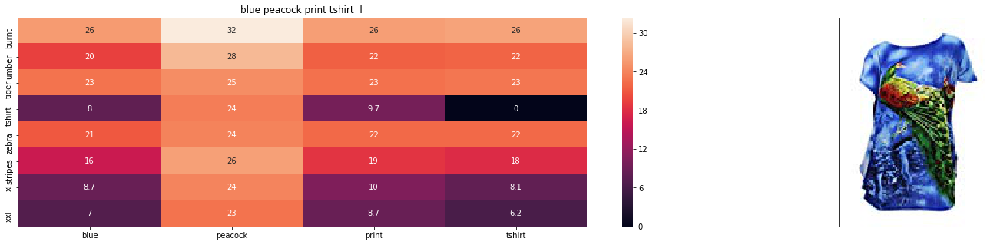

ASIN : B00JXQC8L6
Brand : Si Row
euclidean distance from input : 4.203900146665063


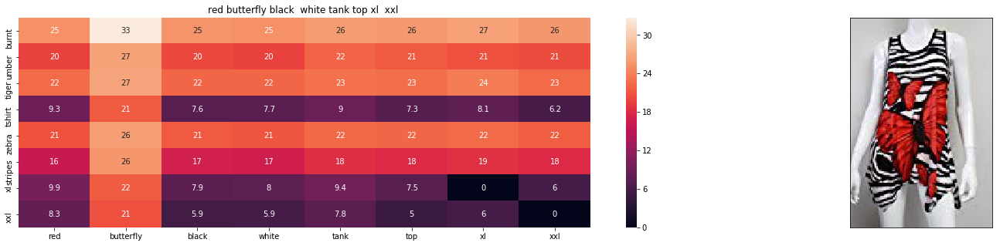

ASIN : B00JV63CW2
Brand : Si Row
euclidean distance from input : 4.286586761655298


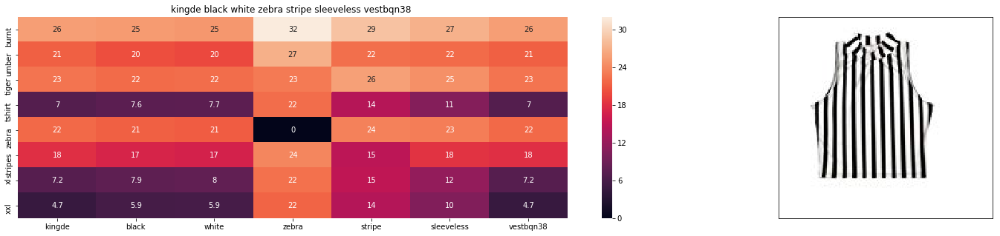

ASIN : B015H41F6G
Brand : KINGDE
euclidean distance from input : 4.389370597243721


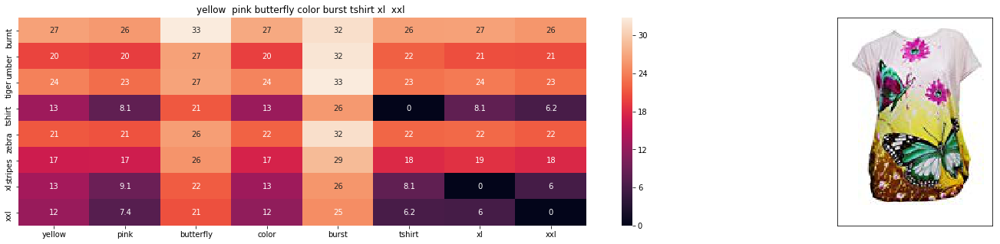

ASIN : B00JXQBBMI
Brand : Si Row
euclidean distance from input : 4.397910309018579


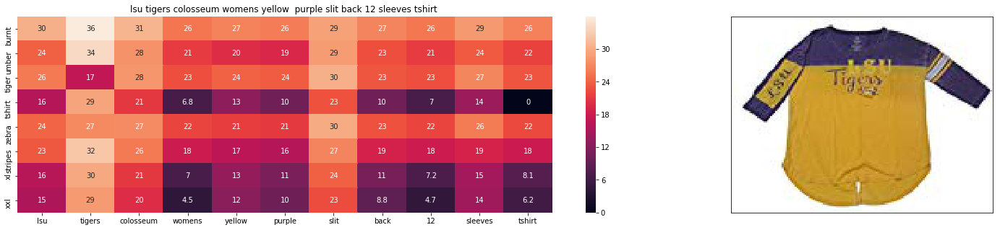

ASIN : B073R5Q8HD
Brand : Colosseum
euclidean distance from input : 4.451228965163643


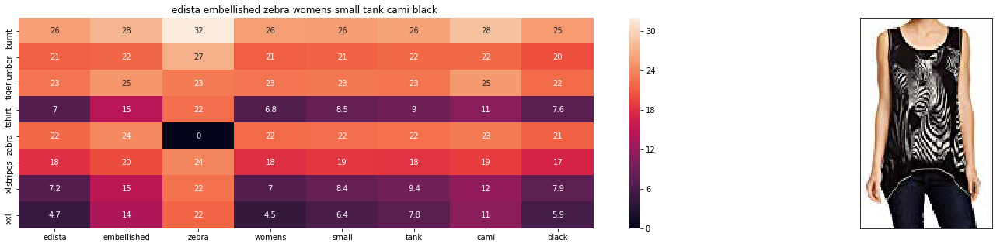

ASIN : B074P8MD22
Brand : Edista
euclidean distance from input : 4.518977797866279


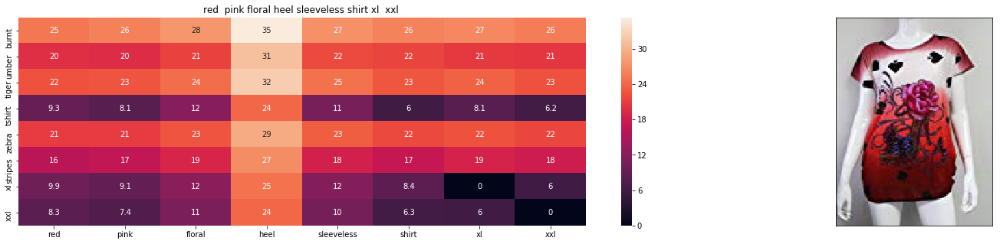

ASIN : B00JV63QQE
Brand : Si Row
euclidean distance from input : 4.529375076474634


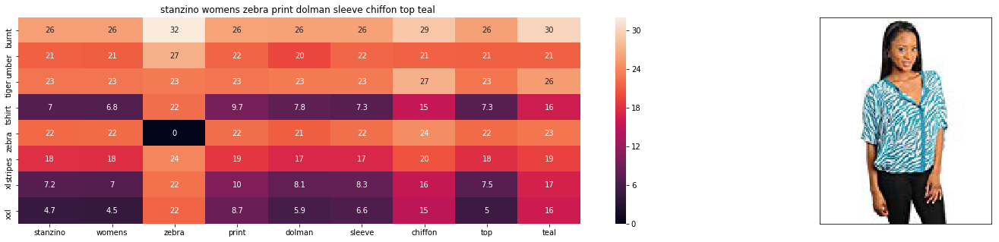

ASIN : B00C0I3U3E
Brand : Stanzino
euclidean distance from input : 4.530326140761788


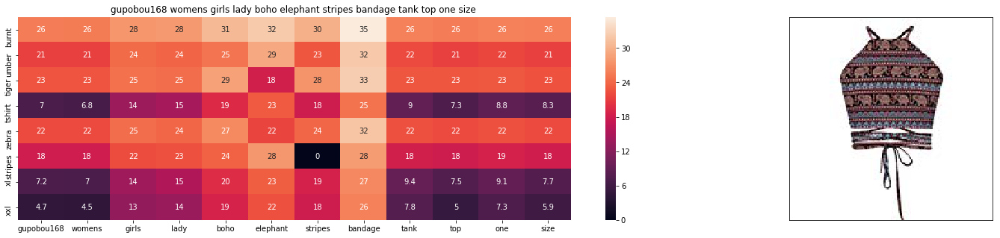

ASIN : B01ER184O6
Brand : GuPoBoU168
euclidean distance from input : 4.546817024028215


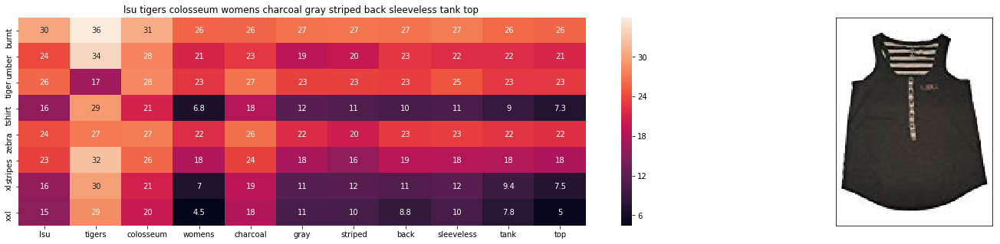

ASIN : B073R4ZM7Y
Brand : Colosseum
euclidean distance from input : 4.548355544448311


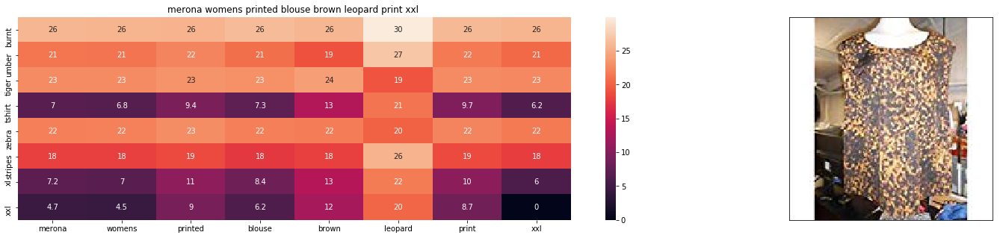

ASIN : B071YF3WDD
Brand : Merona
euclidean distance from input : 4.610627425551827


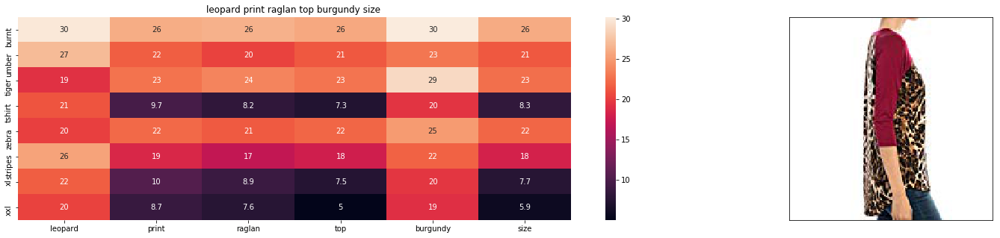

ASIN : B01C6ORLDQ
Brand : 1 Mad Fit
euclidean distance from input : 4.645918274287157


In [68]:
def idf_w2v_brand(doc_id, w1, w2, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist)/float(w1 + w2)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(12566, 5, 5, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

In [67]:
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dropout ,Flatten,Dense
from keras import applications
from sklearn.metrics import pairwise_distances 
import matplotlib.pyplot as plt
import requests
from PIL import Image
import pandas as pd
import pickle


  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

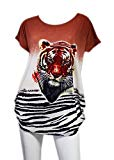

Product Title:  burnt umber tiger tshirt zebra stripes xl  xxl 
Euclidean Distance from input image: 0.0625
Amazon Url: www.amzon.com/dp/B00JXQB5FQ


  5%|████▏                                                                              | 1/20 [00:19<06:05, 19.25s/it]

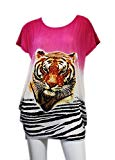

Product Title:  pink tiger tshirt zebra stripes xl  xxl 
Euclidean Distance from input image: 30.050072
Amazon Url: www.amzon.com/dp/B00JXQASS6


 10%|████████▎                                                                          | 2/20 [00:19<04:04, 13.58s/it]

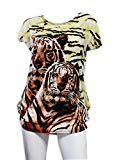

Product Title:  yellow tiger tshirt tiger stripes  l 
Euclidean Distance from input image: 41.261078
Amazon Url: www.amzon.com/dp/B00JXQCUIC


 15%|████████████▍                                                                      | 3/20 [00:19<02:42,  9.55s/it]

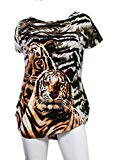

Product Title:  brown  white tiger tshirt tiger stripes xl  xxl 
Euclidean Distance from input image: 44.000187
Amazon Url: www.amzon.com/dp/B00JXQCWTO


 20%|████████████████▌                                                                  | 4/20 [00:19<01:48,  6.76s/it]

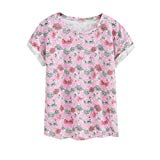

Product Title:  kawaii pastel tops tees pink flower design 
Euclidean Distance from input image: 47.38251
Amazon Url: www.amzon.com/dp/B071FCWD97


 25%|████████████████████▊                                                              | 5/20 [00:20<01:11,  4.76s/it]

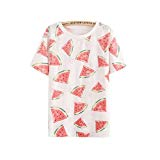

Product Title:  womens thin style tops tees pastel watermelon print 
Euclidean Distance from input image: 47.718403
Amazon Url: www.amzon.com/dp/B01JUNHBRM


 30%|████████████████████████▉                                                          | 6/20 [00:20<00:47,  3.38s/it]

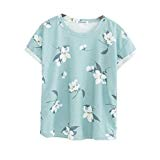

Product Title:  kawaii pastel tops tees baby blue flower design 
Euclidean Distance from input image: 47.9021
Amazon Url: www.amzon.com/dp/B071SBCY9W


 35%|█████████████████████████████                                                      | 7/20 [00:20<00:31,  2.44s/it]

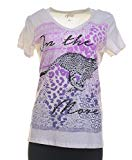

Product Title:  edv cheetah run purple multi xl 
Euclidean Distance from input image: 48.046516
Amazon Url: www.amzon.com/dp/B01CUPYBM0


 40%|█████████████████████████████████▏                                                 | 8/20 [00:20<00:20,  1.74s/it]

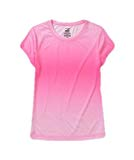

Product Title:  danskin womens vneck loose performance tee xsmall pink ombre 
Euclidean Distance from input image: 48.101917
Amazon Url: www.amzon.com/dp/B01F7PHXY8


 45%|█████████████████████████████████████▎                                             | 9/20 [00:20<00:14,  1.27s/it]

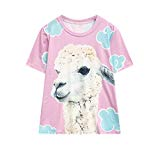

Product Title:  summer alpaca 3d pastel casual loose tops tee design 
Euclidean Distance from input image: 48.118877
Amazon Url: www.amzon.com/dp/B01I80A93G


 50%|█████████████████████████████████████████                                         | 10/20 [00:20<00:09,  1.06it/s]

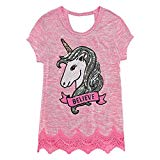

Product Title:  miss chievous juniors striped peplum tank top medium shadowpeach 
Euclidean Distance from input image: 48.13129
Amazon Url: www.amzon.com/dp/B0177DM70S


 55%|█████████████████████████████████████████████                                     | 11/20 [00:21<00:06,  1.37it/s]

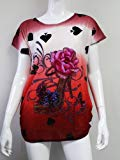

Product Title:  red  pink floral heel sleeveless shirt xl  xxl 
Euclidean Distance from input image: 48.16947
Amazon Url: www.amzon.com/dp/B00JV63QQE


 60%|█████████████████████████████████████████████████▏                                | 12/20 [00:21<00:04,  1.80it/s]

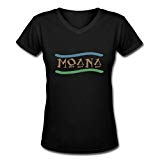

Product Title:  moana logo adults hot v neck shirt black xxl 
Euclidean Distance from input image: 48.25679
Amazon Url: www.amzon.com/dp/B01LX6H43D


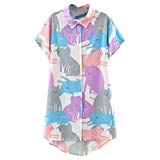

Product Title:  abaday multicolor cartoon cat print short sleeve longline shirt large 
Euclidean Distance from input image: 48.265633
Amazon Url: www.amzon.com/dp/B01CR57YY0


 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [00:21<00:02,  2.40it/s]

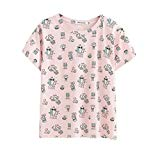

Product Title:  kawaii cotton pastel tops tees peach pink cactus design 
Euclidean Distance from input image: 48.362583
Amazon Url: www.amzon.com/dp/B071WYLBZS


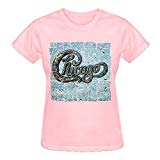

Product Title:  chicago chicago 18 shirt women pink 
Euclidean Distance from input image: 48.383617
Amazon Url: www.amzon.com/dp/B01GXAZTRY


 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [00:21<00:01,  3.19it/s]

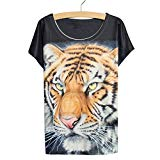

Product Title:  yichun womens tiger printed summer tshirts tops 
Euclidean Distance from input image: 48.449303
Amazon Url: www.amzon.com/dp/B010NN9RXO


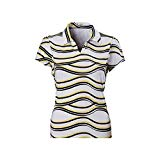

Product Title:  nancy lopez whimsy short sleeve  whiteblacklemon drop  xs 
Euclidean Distance from input image: 48.478912
Amazon Url: www.amzon.com/dp/B01MPX6IDX


 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [00:21<00:00,  4.13it/s]

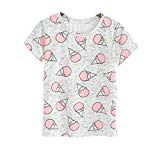

Product Title:  womens tops tees pastel peach ice cream cone print 
Euclidean Distance from input image: 48.557964
Amazon Url: www.amzon.com/dp/B0734GRKZL


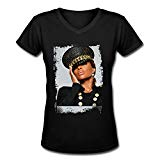

Product Title:  uswomens mary j blige without tshirts shirt 
Euclidean Distance from input image: 48.614376
Amazon Url: www.amzon.com/dp/B01M0XXFKK


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:22<00:00,  3.93it/s]


In [50]:
bottleneck_features_train = np.load('16k_data_cnn_features.npy')
asins = np.load('16k_data_cnn_feature_asins.npy')
asins = list(asins)

# load the original 16K dataset
data = pd.read_pickle('16k_apperal_data_preprocessed')
df_asins = list(data['asin'])


from IPython.display import display, Image, SVG, Math, YouTubeVideo


#get similar products using CNN features (VGG-16)
def get_similar_products_cnn(doc_id, num_results):
    doc_id = asins.index(df_asins[doc_id])
    pairwise_dist = pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))

    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    for i in tqdm(range(len(indices))):
        
        rows = data[['medium_image_url','title']].loc[data['asin']==asins[indices[i]]]
        for indx, row in rows.iterrows():
            display(Image(url=row['medium_image_url'], embed=True))
            print('Product Title: ', row['title'])
            print('Euclidean Distance from input image:', pdists[i])
            print('Amazon Url: www.amzon.com/dp/'+ asins[indices[i]])

get_similar_products_cnn(12566, 20)


In [57]:
bottleneck_features_train.shape

(16042, 25088)

Using text brand color type and cnn features Together

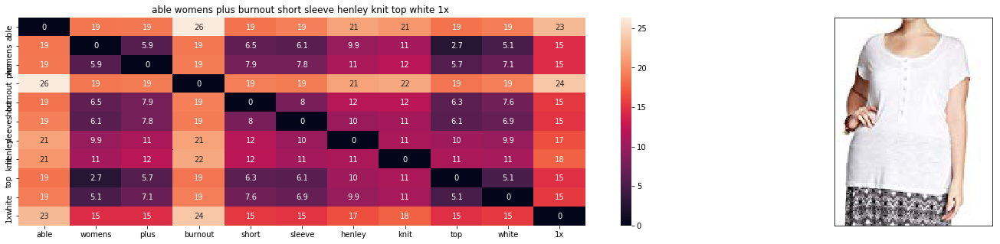

ASIN : B074VCGP84
Brand : able
euclidean distance from input : 0.0


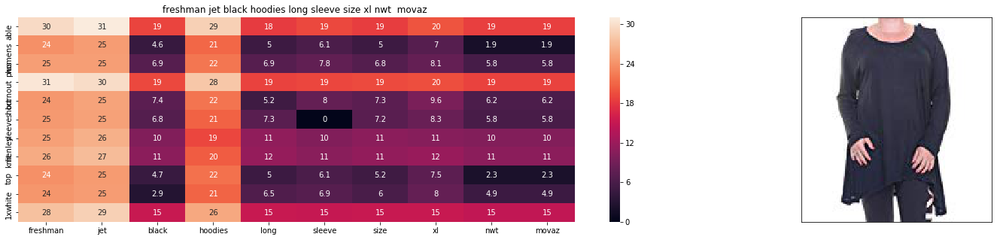

ASIN : B072J1QLVJ
Brand : Freshman 1996
euclidean distance from input : 17.397623825073243


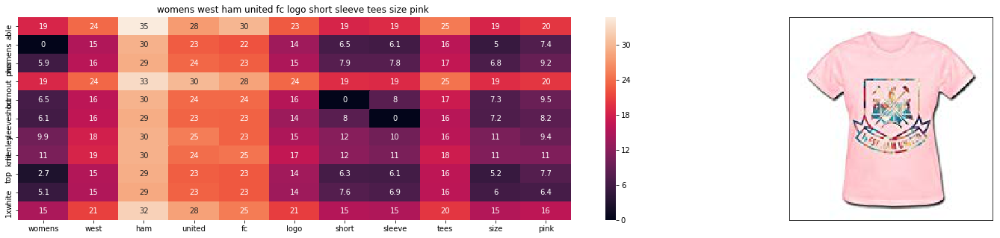

ASIN : B015K88D78
Brand : Fire-Dog-Custom Tees
euclidean distance from input : 18.199795532226563


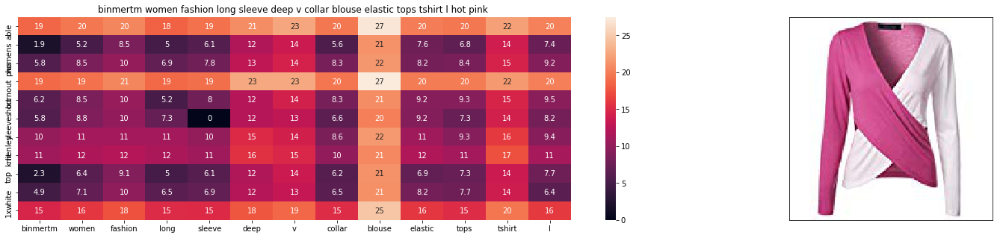

ASIN : B06XKFCVH9
Brand : Binmer(TM)
euclidean distance from input : 18.28920421600342


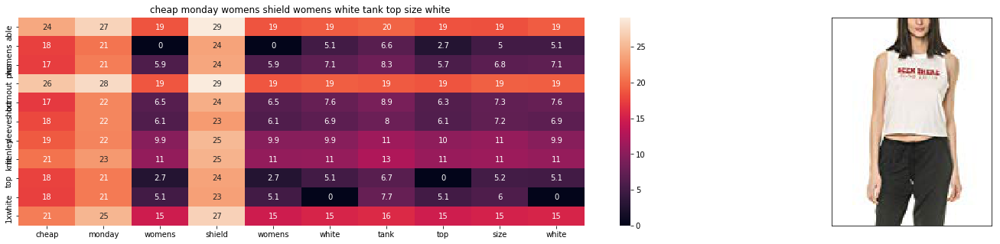

ASIN : B06XHFR9NN
Brand : Cheap Monday
euclidean distance from input : 19.57172794342041


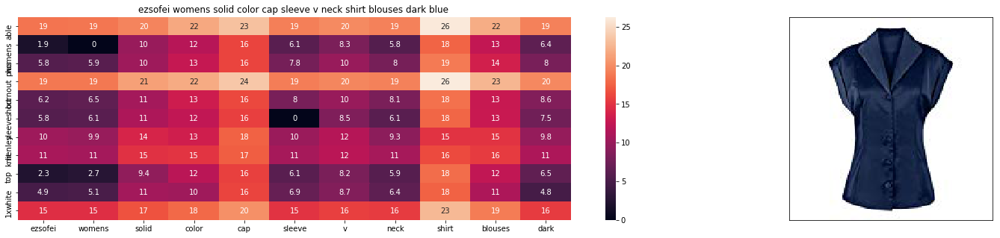

ASIN : B01G6C37UK
Brand : Ez-sofei
euclidean distance from input : 21.03306007385254


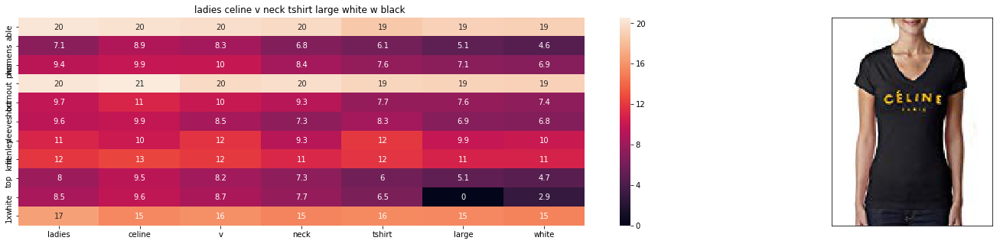

ASIN : B015S1TSNU
Brand : Fashion Place 4 Less
euclidean distance from input : 21.724885940551758


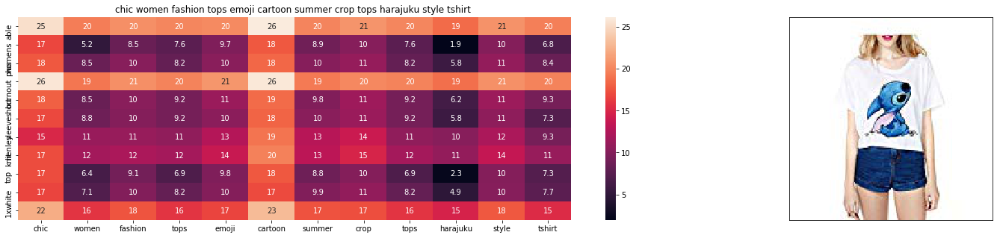

ASIN : B011UERDYA
Brand : Chiclook Cool
euclidean distance from input : 21.747595024108886


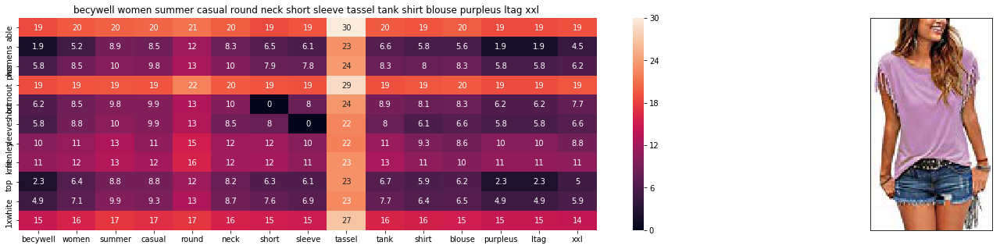

ASIN : B06XT2318J
Brand : BecyWell
euclidean distance from input : 21.80589942932129


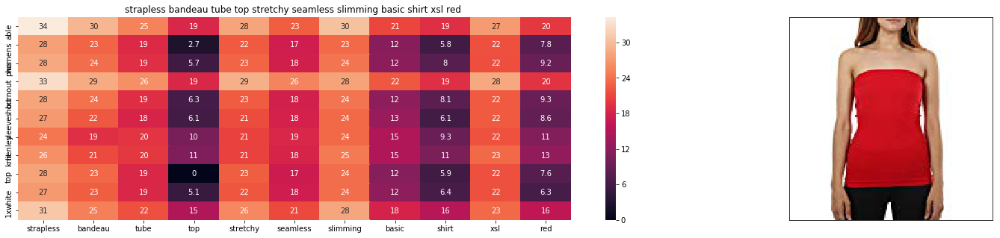

ASIN : B011FGS0N6
Brand : Ekimo
euclidean distance from input : 21.944247817993165


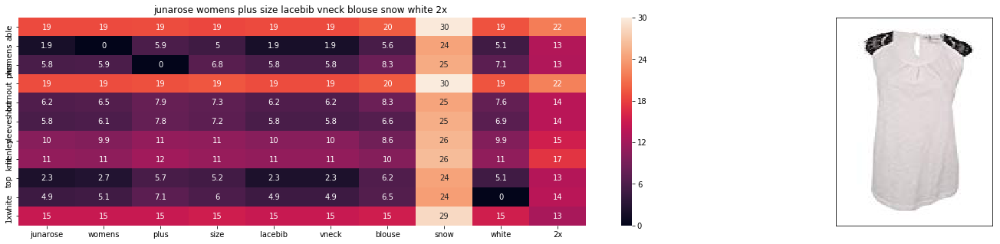

ASIN : B073KRVDVF
Brand : Junarose
euclidean distance from input : 22.13401927947998


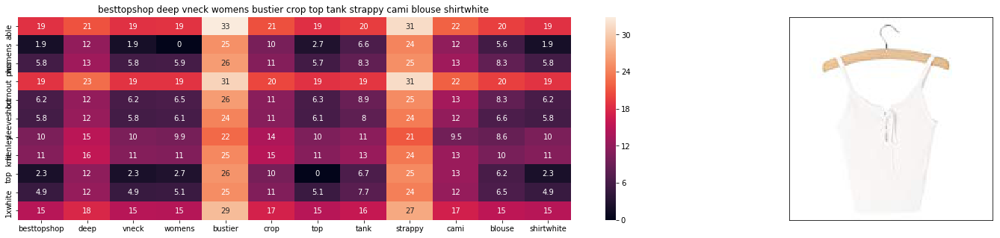

ASIN : B071R4CGQ6
Brand : Best-topshop
euclidean distance from input : 22.151673126220704


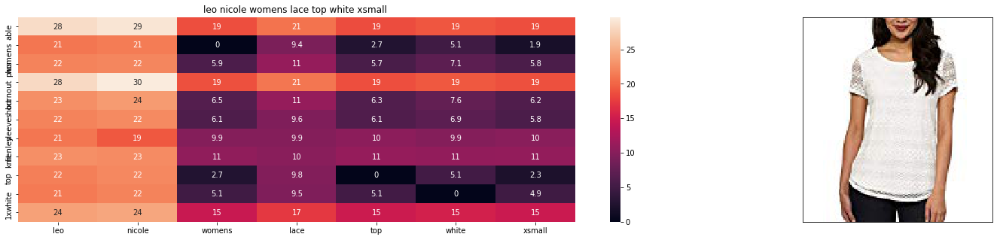

ASIN : B0752ZVCBT
Brand : Leo & Nicole
euclidean distance from input : 22.26804084777832


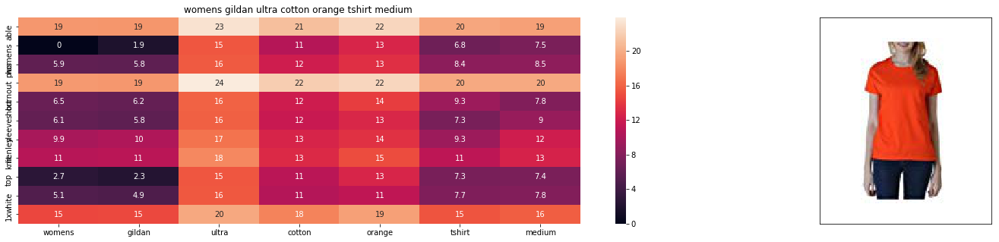

ASIN : B00XLFFL1O
Brand : Gildan
euclidean distance from input : 22.398874282836914


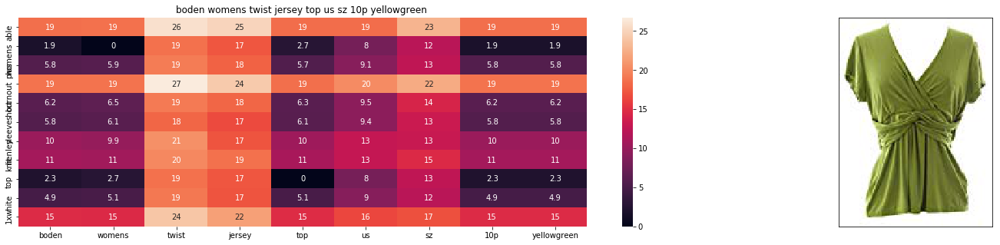

ASIN : B01JMB1B78
Brand : BODEN
euclidean distance from input : 22.683253479003906


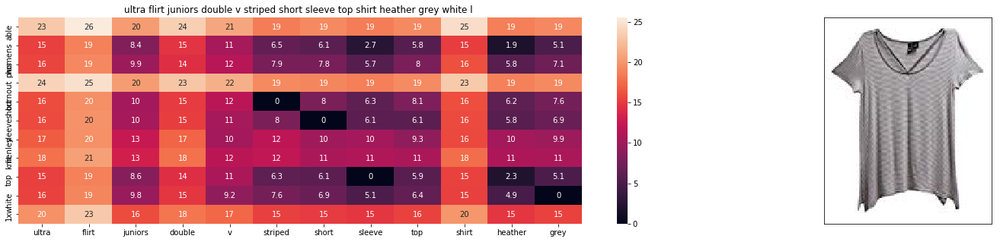

ASIN : B074ZMN7GB
Brand : Ultra Flirt
euclidean distance from input : 22.7580472946167


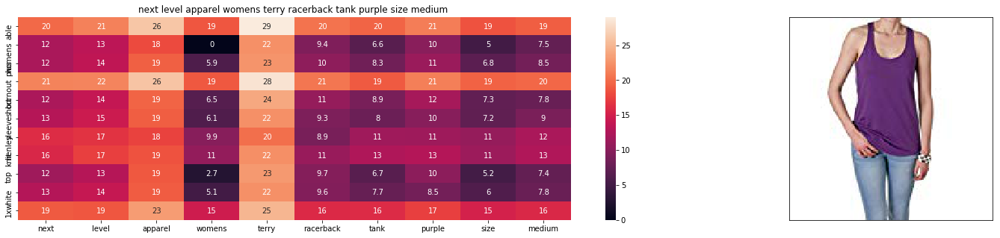

ASIN : B00KQ3TSYU
Brand : Next Level Apparel
euclidean distance from input : 22.774600982666016


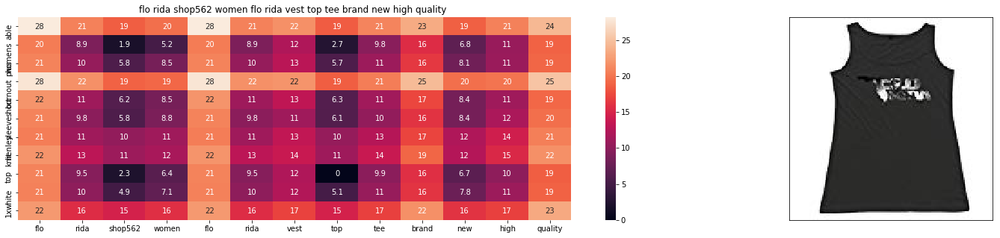

ASIN : B01KJ7RUO2
Brand : Flo Rida Shop562
euclidean distance from input : 22.86021556854248


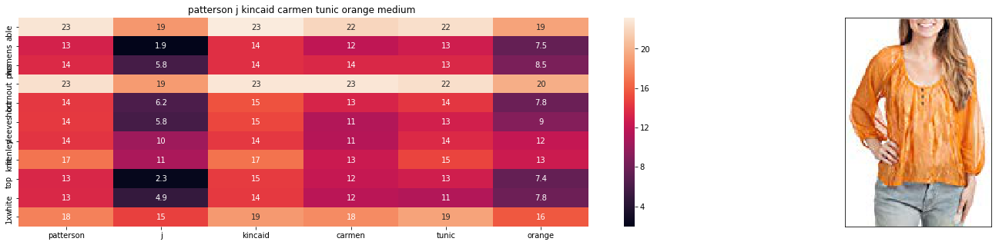

ASIN : B06Y5KLRP2
Brand : Patterson J. Kincaid
euclidean distance from input : 22.86032657623291


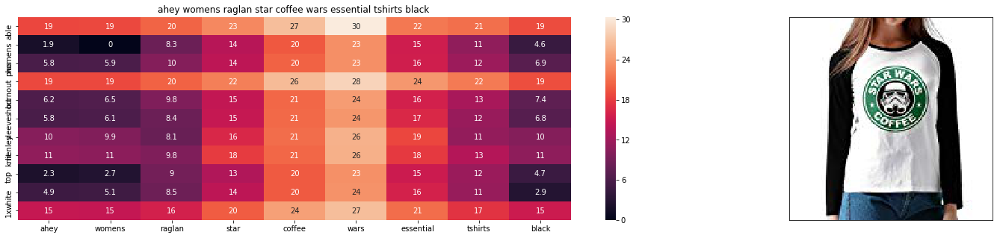

ASIN : B01LYP2R5N
Brand : Ahey Sports T-shirts
euclidean distance from input : 22.878585624694825


In [78]:
def idf_w2v_cnn(doc_id1,w1,w2,w3,num_results):
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id1].reshape(1,-1))

    extra_feat_dist=pairwise_distances(extra_features , extra_features[doc_id1])
    cnn_feat_dist = pairwise_distances(bottleneck_features_train,bottleneck_features_train[doc_id1].reshape(1,-1))
    pairwise_dist = (w1*idf_w2v_dist+w2*extra_feat_dist+w3*cnn_feat_dist)/float(w1+w2+w3)
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists = np.sort(pairwise_dist.flatten())[0:num_results]
    df_indices = list(data.index[indices])
    for i in range(len(indices)):
        
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :' , data['asin'].loc[df_indices[i]])
        print('Brand :', data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_cnn(5612,10,0,10,20)
    